# LibrARIES

In [ ]:
import math
from keras.utils import np_utils
from sklearn import preprocessing
from sklearn.utils import class_weight as cw
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.svm import LinearSVC, SVC
from sklearn import metrics 
import keras
from scipy import misc,ndimage
from keras import models
from keras.layers import Dense
from keras.regularizers import l2
from keras.models import Model
from keras.models import Sequential
from keras.layers import Convolution1D, concatenate, SpatialDropout1D, GlobalMaxPool1D, GlobalAvgPool1D, Embedding, Conv2D, SeparableConv1D, Add, BatchNormalization, Reshape, Activation, GlobalAveragePooling2D, LeakyReLU, Flatten, Conv2DTranspose
from keras.layers import Dense, Input, Dropout, MaxPooling2D, Concatenate, GlobalMaxPooling2D, GlobalAveragePooling2D, Lambda, Multiply, LSTM, Bidirectional, PReLU, MaxPooling1D, UpSampling2D
from keras.applications.densenet import DenseNet201
from keras.applications.nasnet import NASNetMobile, NASNetLarge
from keras.applications.nasnet import preprocess_input
from keras import optimizers
from keras.optimizers import Adam, SGD , RMSprop
from keras.losses import mae, sparse_categorical_crossentropy, binary_crossentropy
from keras import backend as K
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.image as mpimg
import seaborn as sns
import cv2
from PIL import Image
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from skimage import color
from skimage.feature import hog
from sklearn import svm
from sklearn.metrics import classification_report,accuracy_score
from sklearn import metrics
from skimage import data, exposure
from keras import models
from keras import layers
from keras.datasets import cifar10
import matplotlib.pyplot as plt
#from keras.utils import to_categorical
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, LSTM, TimeDistributed
from keras.layers.normalization import BatchNormalization
from keras.layers.advanced_activations import LeakyReLU
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.layers import TimeDistributed, GRU, Dense, Dropout


# upPLOAD

In [ ]:
#download
!pip install -q kaggle
!mkdir ~/.kaggle
!wget https://raw.githubusercontent.com/ms03831/cv_a2/main/kaggle.json
!mv kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d zaynena/selfdriving-car-simulator

--2021-05-30 22:21:29--  https://raw.githubusercontent.com/ms03831/cv_a2/main/kaggle.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70 [text/plain]
Saving to: ‘kaggle.json’

kaggle.json         100%[===================>]      70  --.-KB/s    in 0s      

2021-05-30 22:21:29 (4.36 MB/s) - ‘kaggle.json’ saved [70/70]

100% 2.24G/2.24G [00:27<00:00, 51.3MB/s]
100% 2.24G/2.24G [00:27<00:00, 86.4MB/s]


In [ ]:
#setup directories
!mkdir Project

In [ ]:
#unzip
import shutil
shutil.unpack_archive("/content/selfdriving-car-simulator.zip", "/content/Project")

In [ ]:
# we only need the train images 
!rm -r /content/Project/dataset/
!rm -r /content/Project/track2data/

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

data = ImageDataGenerator(rescale=1./255)

data_generator = data.flow_from_directory(
        '/content/Project',target_size=(160, 320), batch_size=10613, shuffle = False)

Found 31845 images belonging to 1 classes.


In [ ]:
images, _ = next(iter(data_generator))
images.shape

(10613, 160, 320, 3)

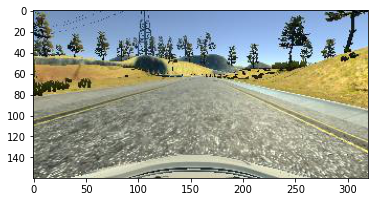

In [ ]:
plt.imshow(images[10612])

In [ ]:
### CHANGE COLUMN TO THE STEERING ANGLE ONE AND VERIFY ####################
### I DONT REMEMBER WHICH COLUMN IT WAS  #################################
### Ignore above comments###
import pandas as pd
df1 = pd.read_csv('/content/Project/track1data/track1data/driving_log.csv',usecols=[3])

In [ ]:
type(df1)

pandas.core.frame.DataFrame

In [ ]:
print(df1)

         0
0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
...    ...
10609  0.0
10610  0.0
10611  0.0
10612  0.0
10613  0.0

[10614 rows x 1 columns]


In [ ]:
labels = np.array(df1)
#labels = labels[:2000]

In [ ]:
print(labels[:50])

[[ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [-0.15     ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [-0.05     ]
 [-0.2      ]
 [-0.4      ]
 [-0.5500001]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [-0.1      ]
 [-0.25     ]
 [-0.45     ]
 [-0.6000001]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [-0.1      ]
 [-0.3      ]
 [-0.45     ]
 [-0.6500001]
 [-0.8500001]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [-0.15     ]
 [-0.3      ]]


In [ ]:
type(labels[0,0])

numpy.float64

# Preprocess labels

(array([  13.,   25.,   92.,  126.,  363.,  591.,  439., 8652.,   64.,
          91.,   62.,   29.,   32.,   19.,   16.]),
 array([-1.        , -0.86666667, -0.73333333, -0.6       , -0.46666667,
        -0.33333333, -0.2       , -0.06666667,  0.06666667,  0.2       ,
         0.33333333,  0.46666667,  0.6       ,  0.73333333,  0.86666667,
         1.        ]),
 <a list of 15 Patch objects>)

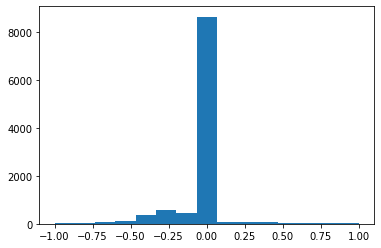

In [ ]:
plt.hist(labels, bins='auto')

dataset is ehavily biased and according to researc papers will takes 100s of epochs to learn. So lets make it smoother

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


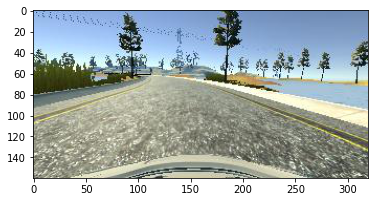

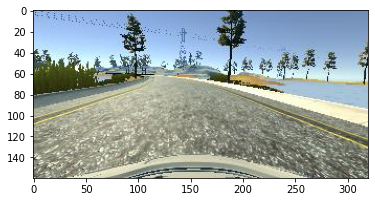

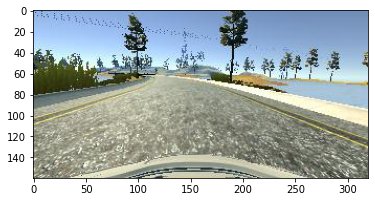

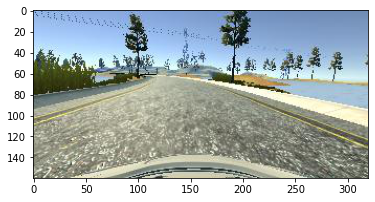

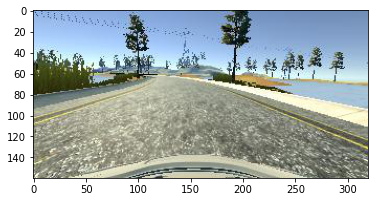

...

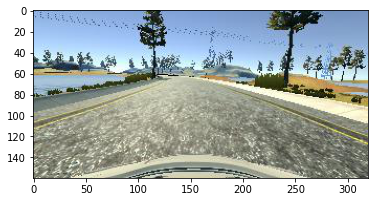

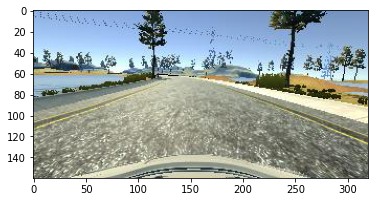

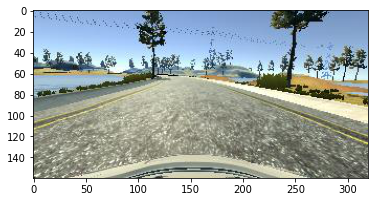

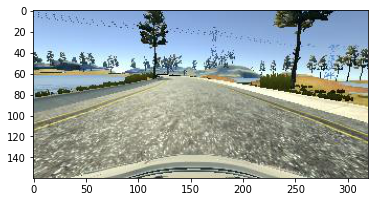

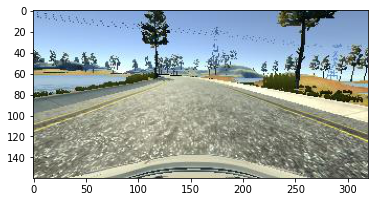

<Figure size 432x288 with 0 Axes>

In [ ]:
for i in range(1500,1540):
  plt.imshow(images[i])
  plt.figure()

Use a moving average filter with different lengt (l)

In [ ]:
l=20
print(l/2)

10.0


In [ ]:
avg_labels_20= []
val = len(labels)
l=20
for i in range(int(l/2)):
  avg_labels_20.append(labels[i])
for i in range(int(l/2)+1,val-int(l/2)):
  avg=0
  for j in range(-int(l/2),int(l/2)):
    avg = avg + labels[i+j]
  avg_labels_20.append(avg/l)
for i in range(val-int(l/2),val):
  avg_labels_20.append(labels[i])

In [ ]:
len(avg_labels_20)


10613

In [ ]:
np.max(avg_labels_20)

0.4475000400000001

In [ ]:
np.min(avg_labels_20)
avg_labels_20 = np.array(avg_labels_20)

In [ ]:
type(avg_labels_20)

numpy.ndarray

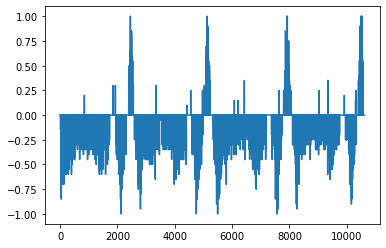

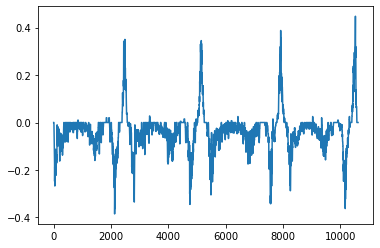

In [ ]:
n=np.array(range(len(labels)))
plt.plot(labels)
plt.figure()
plt.plot(avg_labels_20)

In [ ]:
print(len(labels),len(avg_labels_20))

10614 10613


(array([2.000e+00, 0.000e+00, 1.000e+00, 2.000e+00, 0.000e+00, 2.000e+00,
        4.000e+00, 3.000e+00, 7.000e+00, 4.000e+00, 6.000e+00, 6.000e+00,
        7.000e+00, 8.000e+00, 8.000e+00, 1.200e+01, 8.000e+00, 1.100e+01,
        6.000e+00, 1.000e+01, 2.000e+01, 6.000e+00, 1.300e+01, 2.200e+01,
        3.600e+01, 1.400e+01, 2.500e+01, 4.600e+01, 4.400e+01, 1.800e+01,
        2.000e+01, 3.300e+01, 3.600e+01, 4.600e+01, 3.800e+01, 6.700e+01,
        5.700e+01, 6.300e+01, 4.700e+01, 6.100e+01, 8.600e+01, 8.500e+01,
        1.170e+02, 7.100e+01, 1.460e+02, 1.030e+02, 1.930e+02, 9.400e+01,
        1.670e+02, 3.290e+02, 2.040e+02, 3.660e+02, 2.400e+02, 4.450e+02,
        3.210e+02, 5.790e+02, 4.700e+02, 6.520e+02, 5.400e+02, 5.770e+02,
        5.890e+02, 2.330e+02, 2.099e+03, 4.200e+01, 8.200e+01, 7.900e+01,
        1.110e+02, 4.700e+01, 2.900e+01, 4.600e+01, 2.700e+01, 2.500e+01,
        1.200e+01, 2.700e+01, 1.400e+01, 3.300e+01, 1.500e+01, 9.000e+00,
        1.100e+01, 9.000e+00, 1.100e+0

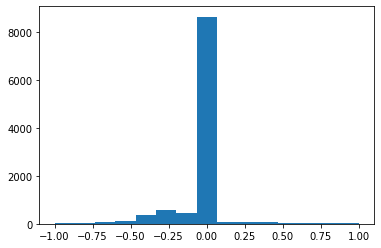

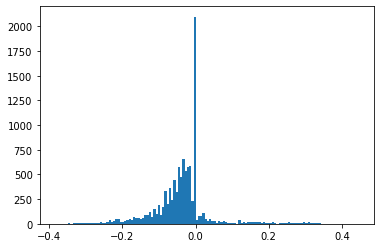

In [ ]:
plt.hist(labels, bins='auto')
plt.figure()
plt.hist(avg_labels_20, bins='auto')

now use n=40

In [ ]:
avg_labels_40= []
val = len(labels)
l=40
for i in range(int(l/2)):
  avg_labels_40.append(labels[i])
for i in range(int(l/2)+1,val-int(l/2)):
  avg=0
  for j in range(-int(l/2),int(l/2)):
    avg = avg + labels[i+j]
  avg_labels_40.append(avg/l)
for i in range(val-int(l/2),val):
  avg_labels_40.append(labels[i])

In [ ]:
len(avg_labels_40) , len(labels)


(10613, 10614)

In [ ]:
np.max(avg_labels_40)

0.3287500375000001

In [ ]:
np.min(avg_labels_40)
avg_labels_40 = np.array(avg_labels_40)

In [ ]:
type(avg_labels_40)

numpy.ndarray

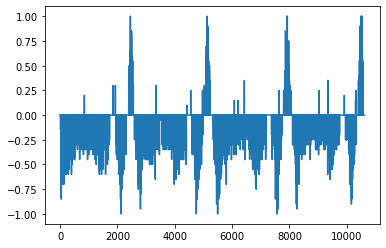

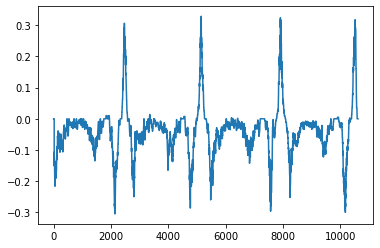

In [ ]:
n=np.array(range(len(labels)))
plt.plot(labels)
plt.figure()
plt.plot(avg_labels_40)

(array([2.000e+00, 2.000e+00, 4.000e+00, 6.000e+00, 8.000e+00, 1.700e+01,
        1.200e+01, 1.200e+01, 1.300e+01, 1.400e+01, 1.500e+01, 1.300e+01,
        1.500e+01, 9.000e+00, 1.700e+01, 6.000e+00, 2.000e+01, 3.300e+01,
        2.300e+01, 2.100e+01, 2.800e+01, 4.600e+01, 5.900e+01, 4.300e+01,
        3.600e+01, 3.700e+01, 5.700e+01, 6.100e+01, 3.500e+01, 5.200e+01,
        4.200e+01, 4.700e+01, 5.500e+01, 6.800e+01, 7.000e+01, 3.900e+01,
        8.400e+01, 6.700e+01, 1.120e+02, 1.200e+02, 1.310e+02, 1.180e+02,
        1.660e+02, 1.870e+02, 2.230e+02, 3.060e+02, 2.050e+02, 2.430e+02,
        3.040e+02, 3.470e+02, 3.750e+02, 3.820e+02, 3.530e+02, 6.510e+02,
        7.590e+02, 6.570e+02, 7.790e+02, 5.630e+02, 3.010e+02, 1.004e+03,
        9.000e+01, 1.690e+02, 5.100e+01, 3.500e+01, 5.000e+01, 2.900e+01,
        3.300e+01, 2.800e+01, 8.000e+00, 6.000e+00, 2.900e+01, 2.900e+01,
        5.000e+00, 9.000e+00, 1.300e+01, 1.500e+01, 8.000e+00, 1.200e+01,
        1.600e+01, 1.900e+01, 1.400e+0

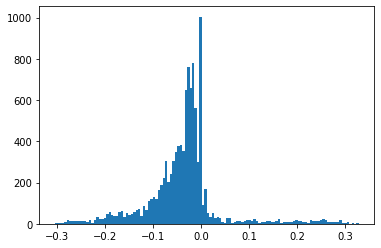

In [ ]:
plt.hist(avg_labels_40, bins='auto')

(array([2.000e+00, 0.000e+00, 1.000e+00, 2.000e+00, 0.000e+00, 2.000e+00,
        4.000e+00, 3.000e+00, 7.000e+00, 4.000e+00, 6.000e+00, 6.000e+00,
        7.000e+00, 8.000e+00, 8.000e+00, 1.200e+01, 8.000e+00, 1.100e+01,
        6.000e+00, 1.000e+01, 2.000e+01, 6.000e+00, 1.300e+01, 2.200e+01,
        3.600e+01, 1.400e+01, 2.500e+01, 4.600e+01, 4.400e+01, 1.800e+01,
        2.000e+01, 3.300e+01, 3.600e+01, 4.600e+01, 3.800e+01, 6.700e+01,
        5.700e+01, 6.300e+01, 4.700e+01, 6.100e+01, 8.600e+01, 8.500e+01,
        1.170e+02, 7.100e+01, 1.460e+02, 1.030e+02, 1.930e+02, 9.400e+01,
        1.670e+02, 3.290e+02, 2.040e+02, 3.660e+02, 2.400e+02, 4.450e+02,
        3.210e+02, 5.790e+02, 4.700e+02, 6.520e+02, 5.400e+02, 5.770e+02,
        5.890e+02, 2.330e+02, 2.099e+03, 4.200e+01, 8.200e+01, 7.900e+01,
        1.110e+02, 4.700e+01, 2.900e+01, 4.600e+01, 2.700e+01, 2.500e+01,
        1.200e+01, 2.700e+01, 1.400e+01, 3.300e+01, 1.500e+01, 9.000e+00,
        1.100e+01, 9.000e+00, 1.100e+0

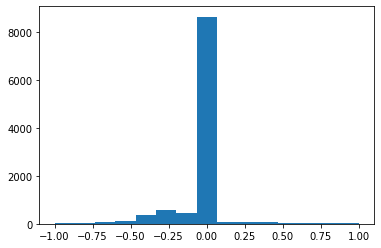

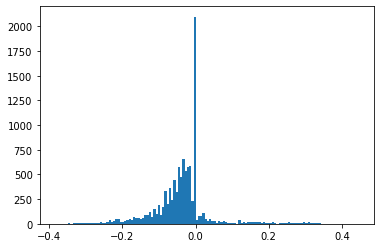

In [ ]:
plt.hist(labels, bins='auto')
plt.figure()
plt.hist(avg_labels_20, bins='auto')

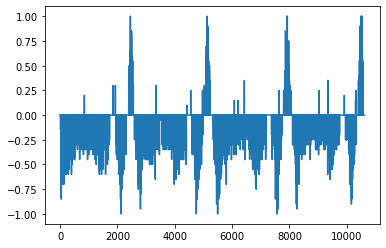

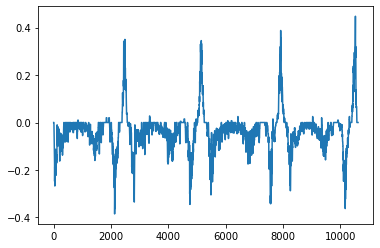

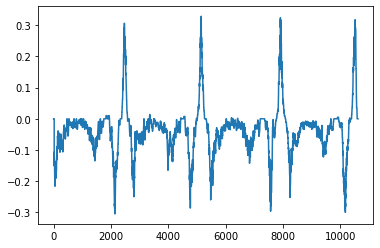

In [ ]:
#Compare l=20 and l = 40
plt.plot(labels)
plt.figure()
plt.plot(avg_labels_20)
plt.figure()
plt.plot(avg_labels_40)

In [ ]:
norm_labels = (avg_labels_40+1)/2

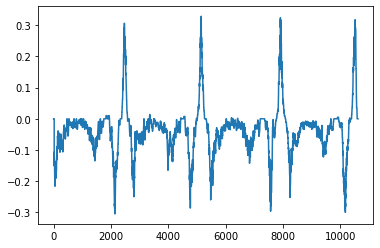

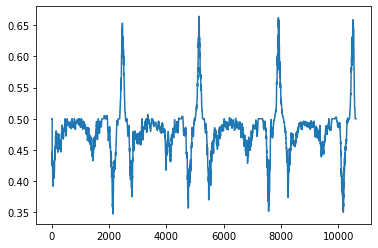

In [ ]:
plt.plot(avg_labels_40)
plt.figure()
plt.plot(norm_labels)

In [ ]:
np.max(norm_labels), np.min(norm_labels)

(0.66437501875, 0.347499985)

In [ ]:
bins = np.array([0.34,0.39,0.44,0.49,0.54,0.59,0.64,0.69])

In [ ]:
rounded = np.round(norm_labels,2)

In [ ]:
np.max(rounded), np.min(rounded)

(0.66, 0.35)

In [ ]:
rounded = np.digitize(rounded, bins)

In [ ]:
np.max(rounded), np.min(rounded)

(7, 1)

In [ ]:
#rounded = ((rounded * 100) - 35).astype('int32')

In [ ]:
#np.max(rounded), np.min(rounded)

Now, our labels are between 0 and 31, so I will make a probability distribution and check on that!

In [ ]:
len(images), len(rounded)

(10613, 10613)

In [ ]:
del avg_labels_20
del avg_labels_40
del norm_labels
del labels

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])



In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(rounded[x])

for x in range(1000):
  y_test.append(rounded[x+7500])

In [ ]:
del rounded

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
inp = Input(shape = x_train[0].shape)
x2 = Conv2D(64, (3, 3), activation = 'relu')(inp) #600 filters - I think leakyrelu might have worked better here 
pool1 = MaxPooling2D()(x2)
x3 = Conv2D(32, (3, 3), activation = 'relu')(pool1) #300 filters - I think leakyrelu might have worked better here
pool2 = MaxPooling2D()(x3)
drop = Dropout(0.6)(pool2) #I saw that I needed to increase the learning rate but then there was overfitting just after conv layers so I dropped a lot of the data
x5 = Flatten()(drop)
x6 = Dense(128, activation = 'relu')(x5) #Got this kernel regularizer and this basically helped achieved lower overfitting at final stages
drop1 = Dropout(0.3)(x6)
x7 = Dense(64, activation = 'relu')(drop1)
drop2 = Dropout(0.3)(x7)
out = Dense(8, activation = 'softmax')(drop2) #Simplistic dense layers
model = Model(inputs = inp, outputs = out)

In [ ]:
#model.compile(loss = "categorical_crossentropy", optimizer = "adamax", metrics=["accuracy"])

In [ ]:
Y_train, Y_test = np_utils.to_categorical(y_train), np_utils.to_categorical(y_test)#

In [ ]:
#history = model.fit(x_train, Y_train, batch_size=64, epochs=5, validation_data=(x_test, Y_test))

In [ ]:
#predictions = model.predict(x_test)

In [ ]:
#predictions

In [ ]:
#predicted_bins = []
#for x in predictions:
#  predicted_bins.append(np.argmax(x))
#predicted_bins = np.array(predicted_bins)

In [ ]:
#np.min(predicted_bins), np.max(predicted_bins)

In [ ]:
#len(x_test), len(Y_test)

In [ ]:
#len(Y_train[0])

# Preprocess - normal Networks

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS = 32, 32, 3
INPUT_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS)
def crop(image):
    """
    Crop the image (removing the sky at the top and the car front at the bottom)
    """
    return image[60:-25, :, :] # remove the sky and the car front


def resize(image):
    """
    Resize the image to the input shape used by the network model
    """
    return cv2.resize(image, (IMAGE_WIDTH, IMAGE_HEIGHT), cv2.INTER_AREA)


def rgb2yuv(image):
    """
    Convert the image from RGB to YUV (This is what the NVIDIA model does)
    """
    return cv2.cvtColor(image, cv2.COLOR_RGB2YUV)


def preprocess(image): #This function directly calls the above 3 functions all together. ISS SE NEECHAY FUNCTIONS I HAVE NOT APPLIED YET
    """
    Combine all preprocess functions into one
    """
    image = crop(image)
    image = resize(image)
    #image = rgb2yuv(image)
    return image

In [ ]:
pp_images=[]
for i in range(3000):
  pp_images.append(preprocess(images[i]))
pp_images = np.array(pp_images)

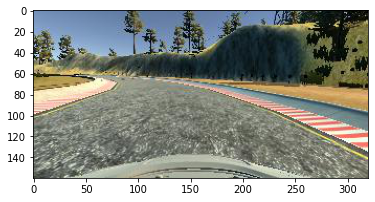

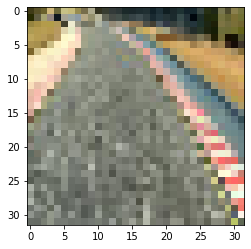

In [ ]:
plt.imshow(images[5])
plt.figure()
plt.imshow(pp_images[5])

In [ ]:
pp_images.shape

(3000, 32, 32, 3)

In [ ]:
x_train = []
x_test = []
y_train = []
y_test = []

for i in range(2400):
  x_train.append(pp_images[i].astype('float64'))
  y_train.append(labels[i].astype('float64'))

for i in range(2400,3000):
  x_test.append(pp_images[i].astype('float64'))
  y_test.append(labels[i].astype('float64'))

x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

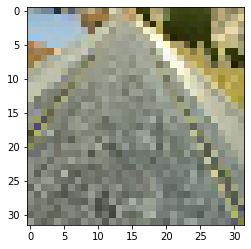

In [ ]:
plt.imshow(x_train[500])

In [ ]:
del pp_images
del images

# Preprocess labels

In [ ]:
### CHANGE COLUMN TO THE STEERING ANGLE ONE AND VERIFY ####################
### I DONT REMEMBER WHICH COLUMN IT WAS  #################################
### Ignore above comments###
import pandas as pd
df1 = pd.read_csv('/content/Project/track1data/track1data/driving_log.csv',usecols=[3])

In [ ]:
labels = np.array(df1)
#labels = labels[:2000]

(array([  13.,   25.,   92.,  126.,  363.,  591.,  439., 8652.,   64.,
          91.,   62.,   29.,   32.,   19.,   16.]),
 array([-1.        , -0.86666667, -0.73333333, -0.6       , -0.46666667,
        -0.33333333, -0.2       , -0.06666667,  0.06666667,  0.2       ,
         0.33333333,  0.46666667,  0.6       ,  0.73333333,  0.86666667,
         1.        ]),
 <a list of 15 Patch objects>)

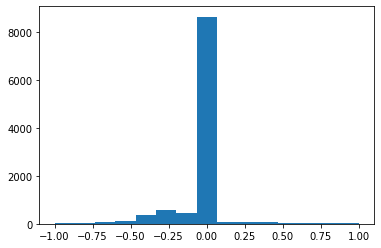

In [ ]:
plt.hist(labels, bins='auto')

dataset is ehavily biased and according to researc papers will takes 100s of epochs to learn. So lets make it smoother

Use a moving average filter with different lengt (l)

In [ ]:
l=20
print(l/2)

10.0


In [ ]:
avg_labels_20= []
l=20
for i in range(int(l/2)):
  avg_labels_20.append(labels[i])
for i in range(int(l/2)+1,10000-int(l/2)):
  avg=0
  for j in range(-int(l/2),int(l/2)):
    avg = avg + labels[i+j]
  avg_labels_20.append(avg/l)
for i in range(10000-int(l/2),10000):
  avg_labels_20.append(labels[i])

In [ ]:
len(avg_labels_20)


9999

In [ ]:
np.max(avg_labels_20)

0.38750002999999994

In [ ]:
np.min(avg_labels_20)
avg_labels_20 = np.array(avg_labels_20)

In [ ]:
type(avg_labels_20)

numpy.ndarray

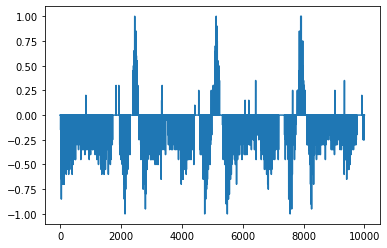

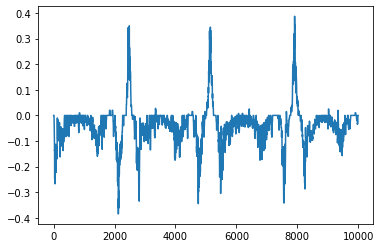

In [ ]:
n=np.array(range(9999))
plt.plot(n,labels[:9999])
plt.figure()
plt.plot(n,avg_labels_20)

(array([2.000e+00, 0.000e+00, 1.000e+00, 1.000e+00, 0.000e+00, 2.000e+00,
        3.000e+00, 2.000e+00, 5.000e+00, 4.000e+00, 5.000e+00, 2.000e+00,
        1.000e+01, 3.000e+00, 9.000e+00, 7.000e+00, 1.100e+01, 3.000e+00,
        9.000e+00, 9.000e+00, 1.500e+01, 8.000e+00, 9.000e+00, 2.600e+01,
        2.900e+01, 1.100e+01, 3.100e+01, 2.500e+01, 2.300e+01, 2.200e+01,
        2.100e+01, 2.700e+01, 4.100e+01, 3.100e+01, 6.100e+01, 5.700e+01,
        5.900e+01, 4.100e+01, 8.000e+01, 4.900e+01, 1.130e+02, 7.400e+01,
        1.020e+02, 9.200e+01, 1.340e+02, 1.190e+02, 1.530e+02, 1.600e+02,
        3.180e+02, 1.970e+02, 3.600e+02, 2.380e+02, 4.390e+02, 3.140e+02,
        5.730e+02, 4.630e+02, 6.390e+02, 5.300e+02, 7.060e+02, 4.080e+02,
        3.130e+02, 1.901e+03, 3.700e+01, 7.600e+01, 7.900e+01, 1.020e+02,
        3.900e+01, 3.900e+01, 3.400e+01, 1.800e+01, 2.200e+01, 1.600e+01,
        5.000e+00, 3.000e+01, 6.000e+00, 1.700e+01, 5.000e+00, 8.000e+00,
        9.000e+00, 8.000e+00, 8.000e+0

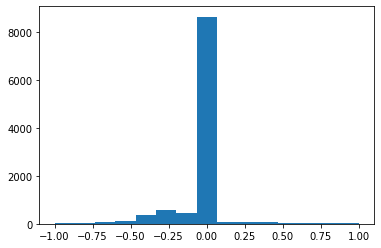

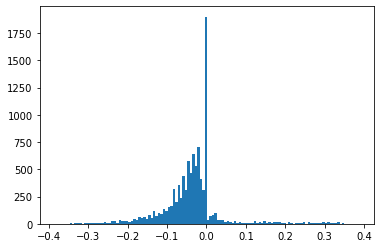

In [ ]:
plt.hist(labels, bins='auto')
plt.figure()
plt.hist(avg_labels_20, bins='auto')

now use n=40

In [ ]:
avg_labels_40= []
l=40
for i in range(int(l/2)):
  avg_labels_40.append(labels[i])
for i in range(int(l/2)+1,10000-int(l/2)):
  avg=0
  for j in range(-int(l/2),int(l/2)):
    avg = avg + labels[i+j]
  avg_labels_40.append(avg/l)
for i in range(10000-int(l/2),10000):
  avg_labels_40.append(labels[i])

In [ ]:
len(avg_labels_40)


9999

In [ ]:
np.max(avg_labels_40)

0.3287500375000001

In [ ]:
np.min(avg_labels_40)
avg_labels_40 = np.array(avg_labels_40)

In [ ]:
type(avg_labels_40)

numpy.ndarray

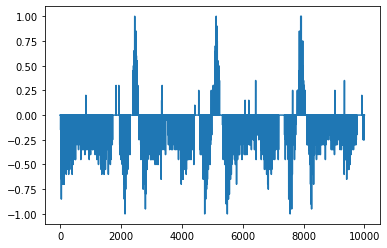

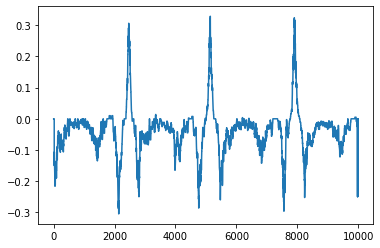

In [ ]:
n=np.array(range(9999))
plt.plot(n,labels[:9999])
plt.figure()
plt.plot(n,avg_labels_40)

(array([2.000e+00, 0.000e+00, 1.000e+00, 1.000e+00, 0.000e+00, 2.000e+00,
        3.000e+00, 2.000e+00, 5.000e+00, 4.000e+00, 5.000e+00, 2.000e+00,
        1.000e+01, 3.000e+00, 9.000e+00, 7.000e+00, 1.100e+01, 3.000e+00,
        9.000e+00, 9.000e+00, 1.500e+01, 8.000e+00, 9.000e+00, 2.600e+01,
        2.900e+01, 1.100e+01, 3.100e+01, 2.500e+01, 2.300e+01, 2.200e+01,
        2.100e+01, 2.700e+01, 4.100e+01, 3.100e+01, 6.100e+01, 5.700e+01,
        5.900e+01, 4.100e+01, 8.000e+01, 4.900e+01, 1.130e+02, 7.400e+01,
        1.020e+02, 9.200e+01, 1.340e+02, 1.190e+02, 1.530e+02, 1.600e+02,
        3.180e+02, 1.970e+02, 3.600e+02, 2.380e+02, 4.390e+02, 3.140e+02,
        5.730e+02, 4.630e+02, 6.390e+02, 5.300e+02, 7.060e+02, 4.080e+02,
        3.130e+02, 1.901e+03, 3.700e+01, 7.600e+01, 7.900e+01, 1.020e+02,
        3.900e+01, 3.900e+01, 3.400e+01, 1.800e+01, 2.200e+01, 1.600e+01,
        5.000e+00, 3.000e+01, 6.000e+00, 1.700e+01, 5.000e+00, 8.000e+00,
        9.000e+00, 8.000e+00, 8.000e+0

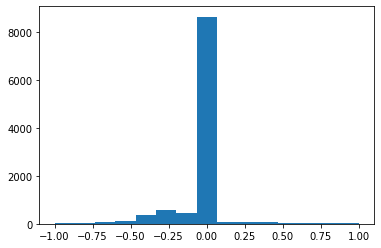

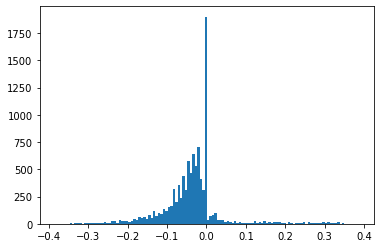

In [ ]:
plt.hist(labels, bins='auto')
plt.figure()
plt.hist(avg_labels_20, bins='auto')

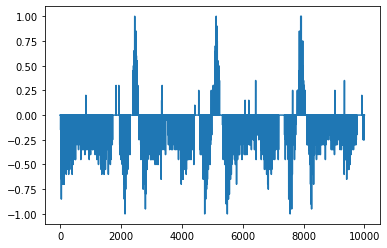

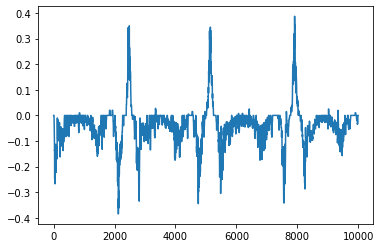

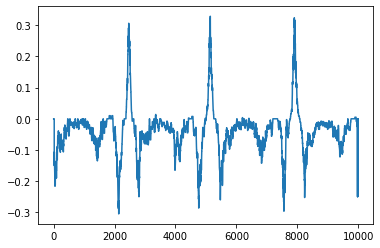

In [ ]:
#Compare l=20 and l = 40
plt.plot(n,labels[:9999])
plt.figure()
plt.plot(n,avg_labels_20)
plt.figure()
plt.plot(n,avg_labels_40)

In [ ]:
norm_labels = (avg_labels_40+1)/2

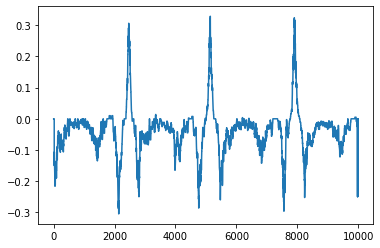

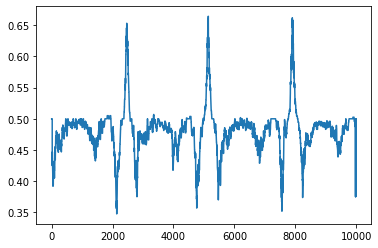

In [ ]:
plt.plot(n,avg_labels_40)
plt.figure()
plt.plot(n,norm_labels)

In [ ]:
labels = norm_labels

In [ ]:
del avg_labels_20
del avg_labels_40
del norm_labels

In [ ]:
labels.shape

(9999, 1)

In [ ]:
del images

# Preprocess LSTM - N = 5

In [ ]:
pp_images.shape

(10000, 75, 320, 3)

In [ ]:
T=5

In [ ]:
T=2000
input_images = []
temp = []
N = 5
for i in range(T-N):
  temp=[]
  for i in range(N):
    temp.append(pp_images[i+N])
  input_images.append(temp)

In [ ]:
input_images = np.array(input_images)
input_images.shape

(1995, 5, 75, 320, 3)

In [ ]:
labels = labels[:T-N]

NameError: ignored

In [ ]:
labels.shape

(9999, 1)

In [ ]:
x_train = []
x_test = []
y_train = []
y_test = []

for i in range(1600):
  x_train.append(input_images[i].astype('float32'))
  y_train.append(labels[i].astype('float32'))

for i in range(1600,1995):
  x_test.append(input_images[i].astype('float32'))
  y_test.append(labels[i].astype('float32'))

x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

del input_images

In [ ]:
x_train.shape

(1600, 5, 75, 320, 3)

In [ ]:
y_train.shape

(1600, 1)

In [ ]:
x_test.shape

(395, 5, 75, 320, 3)

In [ ]:
y_test.shape

(395, 1)

# Preprocess LSTM Collaborative control
 N = 5, time = 50

In [ ]:
pp_images.shape

(10000, 75, 320, 3)

In [ ]:
T=5
tim = 100

In [ ]:
T=2000
input_images = []
temp = []
N = 5
for i in range(T-N-tim):
  temp=[]
  for i in range(N):
    temp.append(pp_images[i+N])
    temp.append(pp_images[i+tim+N])
  input_images.append(temp)

In [ ]:
input_images = np.array(input_images)
input_images.shape

(1945, 10, 75, 320, 3)

In [ ]:
labels = labels[:T-N]

In [ ]:
labels.shape

(1995, 1)

# --------------------------------------------------------------------------------------------------------------
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------



# -------------------------------------------------------------

# --------------------------------------------------------------------------------------------------------------
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------



# v1.1 - VGG -> test stuck at 92%

In [ ]:
new_input = keras.Input(shape=(32,32,3))
base_model = VGG16(weights='imagenet',include_top=False,input_tensor=new_input)

top_model = Sequential() 
top_model.add(Flatten())
top_model.add(Dense(512,activation="relu"))
#top_model.add(Dropout(0.25))
top_model.add(Dense(256,activation="relu"))
#top_model.add(Dropout(0.25))
top_model.add(Dense(1,activation="sigmoid"))

model = Sequential()
for lay in base_model.layers:
  model.add(lay)
model.add(top_model)

model.compile(loss=keras.losses.MeanSquaredError(),optimizer = "adam", metrics=["accuracy"])

58900480/58889256 [==============================] - 1s 0us/step


In [ ]:
history = model.fit(x_train, y_train,batch_size=64,epochs=3, validation_data=(x_test,y_test))

Epoch 1/3
38/38 [==============================] - 180s 4s/step - loss: 0.2461 - accuracy: 0.0000e+00 - val_loss: 0.2615 - val_accuracy: 0.0000e+00
Epoch 2/3
38/38 [==============================] - 166s 4s/step - loss: 0.2759 - accuracy: 0.0000e+00 - val_loss: 0.2615 - val_accuracy: 0.0000e+00
Epoch 3/3
38/38 [==============================] - 163s 4s/step - loss: 0.2757 - accuracy: 0.0000e+00 - val_loss: 0.2615 - val_accuracy: 0.0000e+00


In [ ]:
x = model.predict(x_train)


In [ ]:
x_train.shape

(2400, 32, 32, 3)

In [ ]:
x_train.shape

(2400, 32, 32, 3)

In [ ]:
x.shape

(2400, 1)

In [ ]:
print(np.max(labels))
print(np.min(labels))

0.65312501125
0.347499985


In [ ]:
print(np.max(x))
print(np.min(x))

1.0
1.0


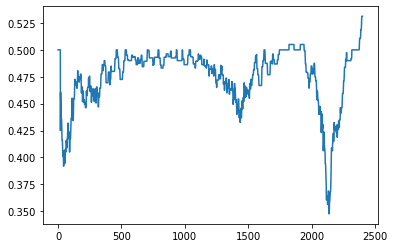

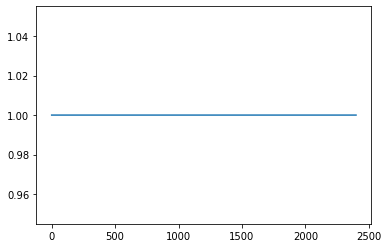

In [ ]:
n=np.array(range(2400))
plt.plot(n,labels[:2400])
plt.figure()
plt.plot(n,x)

# v1.2 - VGG -> Laptop heating up :(

In [ ]:
new_input = keras.Input(shape=(32,32,3))
base_model = VGG16(weights='imagenet',include_top=False,input_tensor=new_input)

top_model = Sequential() 
top_model.add(Flatten())
top_model.add(Dense(1024,activation="relu"))
#top_model.add(Dropout(0.25))
top_model.add(Dense(2048,activation="relu"))
#top_model.add(Dropout(0.25))
top_model.add(Dense(1,activation="sigmoid"))

model = Sequential()
for lay in base_model.layers:
  model.add(lay)
model.add(top_model)

model.compile(loss=keras.losses.MeanSquaredError(),optimizer = "adam", metrics=["accuracy"])

In [ ]:
history = model.fit(x_train, y_train,batch_size=64,epochs=5, validation_data=(x_test,y_test))

Epoch 1/5
 14/125 [==>...........................] - ETA: 13:25 - loss: 0.0880 - accuracy: 0.7894

KeyboardInterrupt: ignored

This was with 1600 train images and 400 test images. Hence didnt work well. now increasing image datasets

# v1.3 - VGG on larger dataset -> test stuck at 80%



In [ ]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator

data = ImageDataGenerator(rescale=1./255)

data_generator = data.flow_from_directory(
        '/content/Project',target_size=(160, 320), batch_size=10000, shuffle = False)

Found 31845 images belonging to 1 classes.


In [ ]:
images, _ = next(iter(data_generator))
images.shape

In [ ]:
plt.imshow(images[9999])

In [ ]:
### CHANGE COLUMN TO THE STEERING ANGLE ONE AND VERIFY ####################
### I DONT REMEMBER WHICH COLUMN IT WAS  #################################
### Ignore above comments###
import pandas as pd
df1 = pd.read_csv('/content/Project/track1data/track1data/driving_log.csv',usecols=[3])

In [ ]:
labels = np.array(df1)
labels = labels[:10000]

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS = 32, 32, 3
INPUT_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS)
def crop(image):
    """
    Crop the image (removing the sky at the top and the car front at the bottom)
    """
    return image[60:-25, :, :] # remove the sky and the car front


def resize(image):
    """
    Resize the image to the input shape used by the network model
    """
    return cv2.resize(image, (IMAGE_WIDTH, IMAGE_HEIGHT), cv2.INTER_AREA)


def rgb2yuv(image):
    """
    Convert the image from RGB to YUV (This is what the NVIDIA model does)
    """
    return cv2.cvtColor(image, cv2.COLOR_RGB2YUV)


def preprocess(image): #This function directly calls the above 3 functions all together. ISS SE NEECHAY FUNCTIONS I HAVE NOT APPLIED YET
    """
    Combine all preprocess functions into one
    """
    image = crop(image)
    image = resize(image)
    #image = rgb2yuv(image)
    return image

In [ ]:
pp_images=[]
for i in range(10000):
  pp_images.append(preprocess(images[i]))
pp_images = np.array(pp_images)

In [ ]:
plt.imshow(images[5])
plt.figure()
plt.imshow(pp_images[5])

In [ ]:
pp_images.shape

(10000, 32, 32, 3)

In [ ]:
x_train = []
x_test = []
y_train = []
y_test = []

for i in range(8000):
  x_train.append(pp_images[i].astype('float32'))
  y_train.append(labels[i].astype('float32'))

for i in range(8000,10000):
  x_test.append(pp_images[i].astype('float32'))
  y_test.append(labels[i].astype('float32'))

x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
new_input = keras.Input(shape=(32,32,3))
base_model = VGG16(weights='imagenet',include_top=False,input_tensor=new_input)

top_model = Sequential() 
top_model.add(Flatten())
top_model.add(Dense(512,activation="relu"))
#top_model.add(Dropout(0.25))
top_model.add(Dense(256,activation="relu"))
#top_model.add(Dropout(0.25))
top_model.add(Dense(1,activation="sigmoid"))

model = Sequential()
for lay in base_model.layers:
  model.add(lay)
model.add(top_model)

model.compile(loss=keras.losses.MeanSquaredError(),optimizer = "adam", metrics=["accuracy"])

58892288/58889256 [==============================] - 1s 0us/step


In [ ]:
history = model.fit(x_train, y_train,batch_size=256,epochs=5, validation_data=(x_test,y_test))

Epoch 1/5
32/32 [==============================] - 858s 27s/step - loss: 0.0548 - accuracy: 0.7900 - val_loss: 0.0142 - val_accuracy: 0.8040
Epoch 2/5
32/32 [==============================] - 857s 27s/step - loss: 0.0251 - accuracy: 0.7967 - val_loss: 0.0142 - val_accuracy: 0.8040
Epoch 3/5
 4/32 [==>...........................] - ETA: 13:07 - loss: 0.0262 - accuracy: 0.7750

KeyboardInterrupt: ignored

# v1.1 - CNN-LSTM - Simple - Not Working

In [ ]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator

data = ImageDataGenerator(rescale=1./255)

data_generator = data.flow_from_directory(
        '/content/Project',target_size=(160, 320), batch_size=10000, shuffle = False)

Found 31845 images belonging to 1 classes.


In [ ]:
images, _ = next(iter(data_generator))
images.shape

(10000, 160, 320, 3)

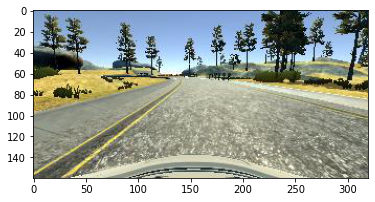

In [ ]:
plt.imshow(images[9999])

In [ ]:
### CHANGE COLUMN TO THE STEERING ANGLE ONE AND VERIFY ####################
### I DONT REMEMBER WHICH COLUMN IT WAS  #################################
### Ignore above comments###
import pandas as pd
df1 = pd.read_csv('/content/Project/track1data/track1data/driving_log.csv',usecols=[3])

In [ ]:
labels = np.array(df1)
labels = labels[:10000]

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS = 32, 32, 3
INPUT_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS)
def crop(image):
    """
    Crop the image (removing the sky at the top and the car front at the bottom)
    """
    return image[60:-25, :, :] # remove the sky and the car front


def resize(image):
    """
    Resize the image to the input shape used by the network model
    """
    return cv2.resize(image, (IMAGE_WIDTH, IMAGE_HEIGHT), cv2.INTER_AREA)


def rgb2yuv(image):
    """
    Convert the image from RGB to YUV (This is what the NVIDIA model does)
    """
    return cv2.cvtColor(image, cv2.COLOR_RGB2YUV)


def preprocess(image): #This function directly calls the above 3 functions all together. ISS SE NEECHAY FUNCTIONS I HAVE NOT APPLIED YET
    """
    Combine all preprocess functions into one
    """
    image = crop(image)
    image = resize(image)
    #image = rgb2yuv(image)
    return image

In [ ]:
pp_images=[]
for i in range(10000):
  pp_images.append(preprocess(images[i]))
pp_images = np.array(pp_images)

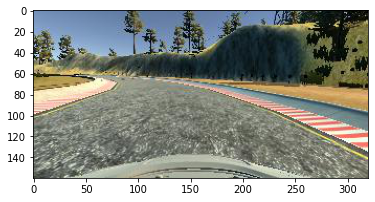

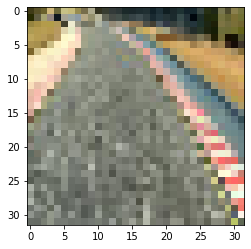

In [ ]:
plt.imshow(images[5])
plt.figure()
plt.imshow(pp_images[5])

In [ ]:
pp_images.shape

(10000, 32, 32, 3)

In [ ]:
x_train = []
x_test = []
y_train = []
y_test = []

for i in range(8000):
  x_train.append(pp_images[i].astype('float32'))
  y_train.append(labels[i].astype('float32'))

for i in range(8000,10000):
  x_test.append(pp_images[i].astype('float32'))
  y_test.append(labels[i].astype('float32'))

x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
#delete faltu variables
del pp_images
del images
del df1

In [ ]:
new_input = keras.Input(shape=(32,32,3))
base_model = VGG16(weights='imagenet',include_top=False,input_tensor=new_input)
base_model = TimeDistributed(base_model)

58892288/58889256 [==============================] - 0s 0us/step


In [ ]:
top_model = Sequential() 
top_model.add(Flatten())
top_model = Sequential()
top_model.add(Dense(512,activation="relu"))
top_model.add(Dense(256,activation="relu"))
top_model.add(Dense(1,activation="sigmoid"))

model = Sequential()
for lay in base_model.layers:
  mode.add(lay)
model1.add(top_model)

#model1.compile(loss=keras.losses.MeanSquaredError(),optimizer = "adam", metrics=["accuracy"])

AttributeError: ignored

In [ ]:

######################################------------------------------------LSTM + VGG
# Update input size

new_input = keras.Input(shape=(32,32,3))
base_model = VGG16(weights='imagenet',include_top=False, input_tensor = new_input)


top_model = Sequential() 

top_model.add(TimeDistributed(Flatten()))

top_model.add(LSTM(units=64))
#top_model.add(LSTM(units=64, activation='tanh'))



top_model.add(Dense(512,activation="relu"))
top_model.add(Dropout(0.4))
top_model.add(Dense(512,activation="relu"))
top_model.add(Dropout(0.4))
top_model.add(Dense(10,activation="relu"))
top_model.add(Dropout(0.4))
top_model.add(Dense(1,activation="sigmoid"))

model = Sequential()

for lay in base_model.layers:
  model.add(lay)      # Try model.add(TimeDistributed(lay)) 



model.add(top_model)

model.compile(loss="binary_crossentropy",optimizer = "adam", metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 32, 32, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 32, 32, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 16, 16, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 16, 16, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 16, 16, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 8, 8, 128)         0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 8, 8, 256)       

In [ ]:
model = Sequential()
model.add(model1)
model.add(Dense(512,activation="relu"))
model.add(Dense(256,activation="relu"))
model.add(Dense(1,activation="sigmoid"))

model.compile(loss=keras.losses.MeanSquaredError(),optimizer = "adam", metrics=["accuracy"])

In [ ]:
model.build(input_shape = keras.Input(shape=(32,32,3)))

In [ ]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_8 (TimeDist multiple                  0         
_________________________________________________________________


ValueError: ignored

In [ ]:
history = model.fit(x_train, y_train,batch_size=256,epochs=5, validation_data=(x_test,y_test))

Epoch 1/5
 7/32 [=====>........................] - ETA: 6:51 - loss: 0.3877 - accuracy: 0.6304

KeyboardInterrupt: ignored

In [ ]:
# define CNN model\
model = Sequential()

model.add(keras.Input(shape=(32,32,3,1,)))

model.add(TimeDistributed(Conv2D(filters=64, kernel_size=(3, 3), padding ="same",activation='relu')))


model.add(TimeDistributed(Conv2D(filters=16, kernel_size=(3, 3),padding ="same", activation='relu')))


model.add(TimeDistributed(Flatten()))

# define LSTM model
model.add(LSTM(64))
model.add(Dense(1024, activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(1, activation='sigmoid'))


In [ ]:
model.compile(loss=keras.losses.MeanSquaredError(),optimizer = "adam", metrics=["accuracy"])

In [ ]:

model.summary()

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_47 (TimeDis (None, 32, 32, 3, 64)     640       
_________________________________________________________________
time_distributed_48 (TimeDis (None, 32, 32, 3, 16)     9232      
_________________________________________________________________
time_distributed_49 (TimeDis (None, 32, 1536)          0         
_________________________________________________________________
lstm_9 (LSTM)                (None, 64)                409856    
_________________________________________________________________
dense_33 (Dense)             (None, 1024)              66560     
_________________________________________________________________
dense_34 (Dense)             (None, 512)               524800    
_________________________________________________________________
dense_35 (Dense)             (None, 1)               

In [ ]:
history = model.fit(x_train, y_train,batch_size=256,epochs=5, validation_data=(x_test,y_test))

Epoch 1/5


ValueError: ignored

# v1.2 - LSTM - Medium

# 1. Image formatting - Frames generation

In [ ]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator

data = ImageDataGenerator(rescale=1./255)

data_generator = data.flow_from_directory(
        '/content/Project',target_size=(160, 320), batch_size=10000, shuffle = False)

Found 31845 images belonging to 1 classes.


In [ ]:
images, _ = next(iter(data_generator))
images.shape

(10000, 160, 320, 3)

In [ ]:
# some global params
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#data = ImageDataGenerator(rescale=1./255)
#data_generator = data.flow_from_directory(
 #       '/content/Project',target_size=(160, 320), batch_size=10000, shuffle = False)
#data_aug = keras.preprocessing.image.ImageDataGenerator(data_generator)



SIZE = (160, 320)
CHANNELS = 3
NBFRAME = 5
BS = 8
train = VideoFrameGenerator(
    '/content/Project',
    classes=[1], 
    nb_frames=5,
    shuffle=True,
    batch_size=BS,
    target_shape=SIZE,
    nb_channel=CHANNELS,
    transformation=data)

NameError: ignored

In [ ]:
vid, _ = next(iter(train))
vid.shape

(0,)

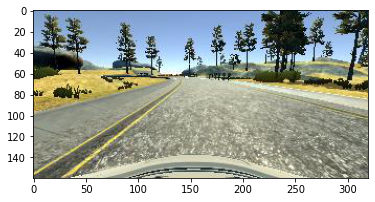

In [ ]:
plt.imshow(images[9999])

In [ ]:
### CHANGE COLUMN TO THE STEERING ANGLE ONE AND VERIFY ####################
### I DONT REMEMBER WHICH COLUMN IT WAS  #################################
### Ignore above comments###
import pandas as pd
df1 = pd.read_csv('/content/Project/track1data/track1data/driving_log.csv',usecols=[3])

In [ ]:
labels = np.array(df1)
labels = labels[:10000]

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS = 32, 32, 3
INPUT_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS)
def crop(image):
    """
    Crop the image (removing the sky at the top and the car front at the bottom)
    """
    return image[60:-25, :, :] # remove the sky and the car front


def resize(image):
    """
    Resize the image to the input shape used by the network model
    """
    return cv2.resize(image, (IMAGE_WIDTH, IMAGE_HEIGHT), cv2.INTER_AREA)


def rgb2yuv(image):
    """
    Convert the image from RGB to YUV (This is what the NVIDIA model does)
    """
    return cv2.cvtColor(image, cv2.COLOR_RGB2YUV)


def preprocess(image): #This function directly calls the above 3 functions all together. ISS SE NEECHAY FUNCTIONS I HAVE NOT APPLIED YET
    """
    Combine all preprocess functions into one
    """
    image = crop(image)
    #image = resize(image)
    #image = rgb2yuv(image)
    return image

In [ ]:
pp_images=[]
for i in range(10000):
  pp_images.append(preprocess(images[i]))
pp_images = np.array(pp_images)

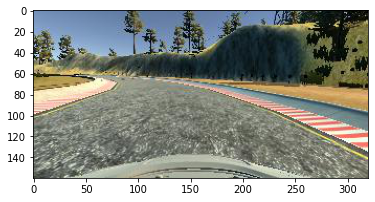

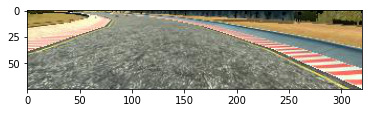

In [ ]:
plt.imshow(images[5])
plt.figure()
plt.imshow(pp_images[5])

In [ ]:
pp_images.shape

(10000, 75, 320, 3)

In [ ]:
del images
del df1

In [ ]:
x_train = []
x_test = []
y_train = []
y_test = []

for i in range(8000):
  x_train.append(pp_images[i].astype('float32'))
  y_train.append(labels[i].astype('float32'))

for i in range(8000,10000):
  x_test.append(pp_images[i].astype('float32'))
  y_test.append(labels[i].astype('float32'))

x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
#delete faltu variables
del pp_images


***Medium logic below***

# Preprocess images for LSTM

In [ ]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator

data = ImageDataGenerator(rescale=1./255)

data_generator = data.flow_from_directory(
        '/content/Project',target_size=(160, 320), batch_size=10000, shuffle = False)

Found 31845 images belonging to 1 classes.


In [ ]:
images, _ = next(iter(data_generator))
images.shape

(10000, 160, 320, 3)

In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS = 32, 32, 3
INPUT_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS)
def crop(image):
    """
    Crop the image (removing the sky at the top and the car front at the bottom)
    """
    return image[60:-25, :, :] # remove the sky and the car front


def resize(image):
    """
    Resize the image to the input shape used by the network model
    """
    return cv2.resize(image, (IMAGE_WIDTH, IMAGE_HEIGHT), cv2.INTER_AREA)


def rgb2yuv(image):
    """
    Convert the image from RGB to YUV (This is what the NVIDIA model does)
    """
    return cv2.cvtColor(image, cv2.COLOR_RGB2YUV)


def preprocess(image): #This function directly calls the above 3 functions all together. ISS SE NEECHAY FUNCTIONS I HAVE NOT APPLIED YET
    """
    Combine all preprocess functions into one
    """
    image = crop(image)
    #image = resize(image)
    #image = rgb2yuv(image)
    return image

In [ ]:
pp_images=[]
for i in range(10000):
  pp_images.append(preprocess(images[i]))
pp_images = np.array(pp_images)

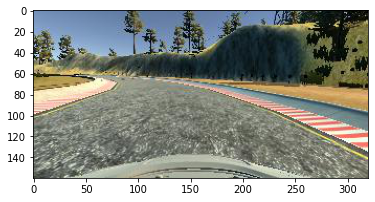

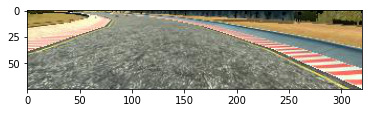

In [ ]:
plt.imshow(images[5])
plt.figure()
plt.imshow(pp_images[5])

In [ ]:
del data
del data_generator

# 2. Models

In [ ]:
x_train = []
x_test = []
y_train = []
y_test = []

for i in range(1600):
  x_train.append(input_images[i].astype('float32'))
  y_train.append(labels[i].astype('float32'))

for i in range(1600,1995):
  x_test.append(input_images[i].astype('float32'))
  y_test.append(labels[i].astype('float32'))

x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

del input_images

In [ ]:
x_train.shape

(1600, 5, 75, 320, 3)

In [ ]:
y_train.shape

(1600, 1)

In [ ]:
x_test.shape

(395, 5, 75, 320, 3)

In [ ]:
y_test.shape

(395, 1)

***build model: First build convnet used for feature extraction***

In [ ]:
from keras.layers import Conv2D, BatchNormalization, MaxPool2D, GlobalMaxPool2D
def build_convnet(shape=(75, 320, 3)):
    momentum = .9
    model = keras.Sequential()
    model.add(Conv2D(64, (3,3), input_shape=shape, padding='same', activation='relu'))
    model.add(Conv2D(64, (3,3), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    
    model.add(MaxPool2D())
    
    model.add(Conv2D(128, (3,3), padding='same', activation='relu'))
    model.add(Conv2D(128, (3,3), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    
    model.add(MaxPool2D())
    
    model.add(Conv2D(256, (3,3), padding='same', activation='relu'))
    model.add(Conv2D(256, (3,3), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    
    model.add(MaxPool2D())
    
    model.add(Conv2D(512, (3,3), padding='same', activation='relu'))
    model.add(Conv2D(512, (3,3), padding='same', activation='relu'))
    model.add(BatchNormalization(momentum=momentum))
    
    # flatten...
    model.add(GlobalMaxPool2D())
    return model


***Now build GRU + dense model. GRU is similar to LSTM but less efficient and consumes less memory***

In [ ]:
from keras.layers import TimeDistributed, GRU, Dense, Dropout
def action_model(shape=(5, 75, 320, 3), nbout=1):
    convnet = build_convnet(shape[1:])
    
    # then create our final model
    model = keras.Sequential()
    # add the convnet with (5, 112, 112, 3) shape
    model.add(TimeDistributed(convnet, input_shape=shape))
    # here, you can also use GRU or LSTM
    model.add(GRU(64))
    # and finally, we make a decision network
    model.add(Dense(1024, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(.5))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(nbout, activation='sigmoid'))
    return model

The model takes multiple (5) images as input, to capture temporal info as explained previously

In [ ]:
SIZE = (75, 320)
CHANNELS = 3
NBFRAME = 5
BS = 8
classes = [1]
INSHAPE=(NBFRAME,) + SIZE + (CHANNELS,)
model = action_model(INSHAPE, len(classes))
optimizer = keras.optimizers.Adam(0.001)
model.compile(
    optimizer,
    'categorical_crossentropy',
    metrics=['acc']
)

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 5, 512)            4689216   
_________________________________________________________________
gru (GRU)                    (None, 64)                110976    
_________________________________________________________________
dense (Dense)                (None, 1024)              66560     
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)              

In [ ]:
history = model.fit(x_train, y_train,batch_size=32,epochs=3, validation_data=(x_test,y_test))

Epoch 1/3
50/50 [==============================] - 7061s 141s/step - loss: 0.0000e+00 - acc: 0.7328 - val_loss: 0.0000e+00 - val_acc: 0.9291
Epoch 2/3
 3/50 [>.............................] - ETA: 1:46:00 - loss: 0.0000e+00 - acc: 0.8351

KeyboardInterrupt: ignored

In [ ]:
a = np.array([x_train[18], x_train[19], x_train[20]])
x = model.predict(a)

In [ ]:
print(x[0])
print(x[1])
print(x[2])

[0.]
[0.]
[0.]


In [ ]:
labels[18]

array([0.])

In [ ]:
labels[19]

array([-0.15])

In [ ]:
n=0
for i in range(10000):
  if labels[i,0]>0:
    break
  n = n+1  


In [ ]:
print(n)

848


In [ ]:
labels[848]

array([0.2])

In [ ]:
a = np.array([x_train[848]])
x = model.predict(a)

In [ ]:
print(x)

[[0.]]


In [ ]:
a = np.array(x_test)
x = model.predict(a)

In [ ]:
np.max(x)

0.0

In [ ]:
np.min(x)

0.0

# AlexNet Architecture with LSTM

In [ ]:
resized_train = []
for x in x_train:
  resized_train.append(cv2.resize(x, (227,227), interpolation = cv2.INTER_AREA))


resized_test = []
for x in x_test:
  resized_test.append(cv2.resize(x, (227,227), interpolation = cv2.INTER_AREA))


In [ ]:
del x_train
del x_test

In [ ]:
x_train = np.array(resized_train)
x_test = np.array(resized_test)

In [ ]:
del resized_train
del resized_test

In [ ]:
x_train.shape

(5000, 227, 227, 3)

In [ ]:
T = 5000   # Total Dataset size used
N = 5   # HOW MANY IMAGES LSTM TAKES

In [ ]:
input_images = []
temp = []
for i in range(T-N):
  temp=[]
  for i in range(N):
    temp.append(x_train[i+N])
  input_images.append(temp)

In [ ]:
len(input_images)

4995

In [ ]:
del x_train

In [ ]:
input_images = np.array(input_images)
input_images.shape

In [ ]:
def AlexNet_LSTM(img_shape = x_train[0].shape):
  model = Sequential()

  model.add(Conv2D(96, (11,11),strides=(4,4),activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))



  model.add(Conv2D(256, (5,5),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))



  model.add(Conv2D(384, (3,3),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  

  model.add(Conv2D(384, (3,3),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  

  model.add(Conv2D(256, (3,3),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))

  model.add(Flatten())
  

  model.add(Dense(4096,activation='relu'))
  model.add(Dropout(0.7))

  model.add(Dense(4096,activation='relu'))
  model.add(Dropout(0.7))

  model.add(Dense(8,activation='softmax'))

  return model

In [ ]:
model = AlexNet()
model.summary()

In [ ]:
model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics=["accuracy"])

In [ ]:
history = model.fit(x_train, Y_train, batch_size=1024, epochs=100, validation_data=(x_test, Y_test))

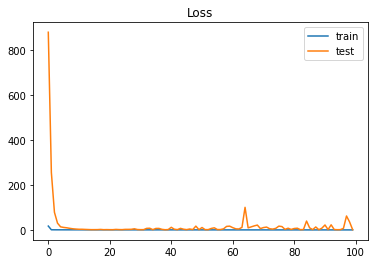

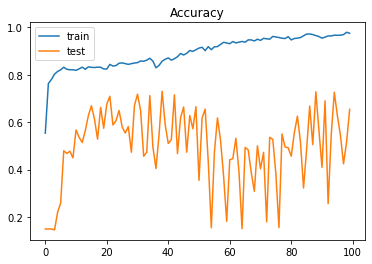

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["accuracy"])
plt.plot(history.history["val_accuracy"])
plt.legend(["train","test"])
plt.show()

In [ ]:
def AlexNet_LSTM(img_shape = x_train[0].shape):
  model = Sequential()

  model.add(TimeDistributed(model, input_shape=img_shape))
  model.add(GRU(64))

  model.add(Conv2D(96, (11,11),strides=(4,4),activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))



  model.add(Conv2D(256, (5,5),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))



  model.add(Conv2D(384, (3,3),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  

  model.add(Conv2D(384, (3,3),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  

  model.add(Conv2D(256, (3,3),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))

  model.add(Flatten())
  

  model.add(Dense(4096,activation='relu'))
  model.add(Dropout(0.5))

  model.add(Dense(4096,activation='relu'))
  model.add(Dropout(0.5))

  model.add(Dense(8,activation='softmax'))

  return model

# Nvidia Model with Averaging filter = 10

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(10,labels)

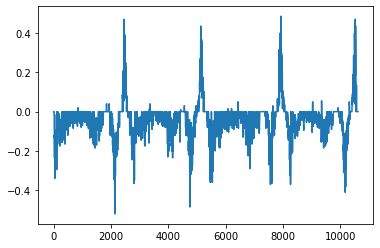

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 69s 149ms/step - loss: 0.0219 - acc: 0.3397 - val_loss: 0.0129 - val_acc: 0.1590
Epoch 2/50
40/40 [==============================] - 5s 118ms/step - loss: 0.0036 - acc: 0.3476 - val_loss: 0.0122 - val_acc: 0.1590
Epoch 3/50
40/40 [==============================] - 5s 118ms/step - loss: 0.0031 - acc: 0.3520 - val_loss: 0.0235 - val_acc: 0.1590
Epoch 4/50
40/40 [==============================] - 5s 119ms/step - loss: 0.0038 - acc: 0.3605 - val_loss: 0.0113 - val_acc: 0.1590
Epoch 5/50
40/40 [==============================] - 5s 117ms/step - loss: 0.0019 - acc: 0.3424 - val_loss: 0.0110 - val_acc: 0.1590
Epoch 6/50
40/40 [==============================] - 5s 118ms/step - loss: 0.0016 - acc: 0.3425 - val_loss: 0.0096 - val_acc: 0.1590
Epoch 7/50
40/40 [==============================] - 5s 119ms/step - loss: 0.0014 - acc: 0.3467 - val_loss: 0.0090 - val_acc: 0.1590
Epoch 8/50
40/40 [==============================] - 5s 119ms/step - loss: 0

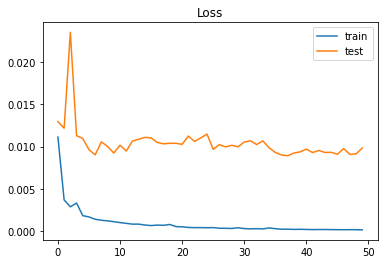

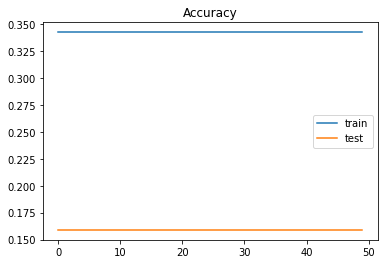

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

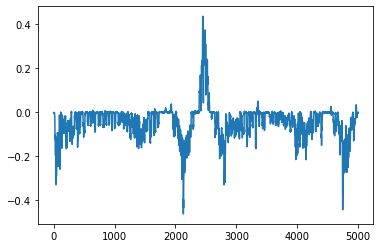

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_10.zip"' "/content/my_model.h5"

mkdir: cannot create directory ‘saved_model’: File exists
  adding: content/my_model.h5 (deflated 25%)


# Nvidia Model with Averaging filter = 20

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(20,labels)

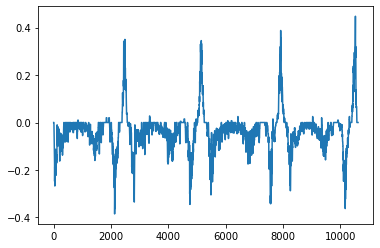

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 67s 149ms/step - loss: 0.1155 - acc: 0.2005 - val_loss: 0.0117 - val_acc: 0.0880
Epoch 2/50
40/40 [==============================] - 5s 118ms/step - loss: 0.0029 - acc: 0.2119 - val_loss: 0.0086 - val_acc: 0.0880
Epoch 3/50
40/40 [==============================] - 5s 115ms/step - loss: 0.0020 - acc: 0.2081 - val_loss: 0.0089 - val_acc: 0.0880
Epoch 4/50
40/40 [==============================] - 5s 115ms/step - loss: 0.0019 - acc: 0.2092 - val_loss: 0.0087 - val_acc: 0.0880
Epoch 5/50
40/40 [==============================] - 5s 115ms/step - loss: 0.0017 - acc: 0.2062 - val_loss: 0.0082 - val_acc: 0.0880
Epoch 6/50
40/40 [==============================] - 5s 117ms/step - loss: 0.0015 - acc: 0.2046 - val_loss: 0.0084 - val_acc: 0.0880
Epoch 7/50
40/40 [==============================] - 5s 116ms/step - loss: 0.0014 - acc: 0.2078 - val_loss: 0.0091 - val_acc: 0.0880
Epoch 8/50
40/40 [==============================] - 5s 118ms/step - loss: 0

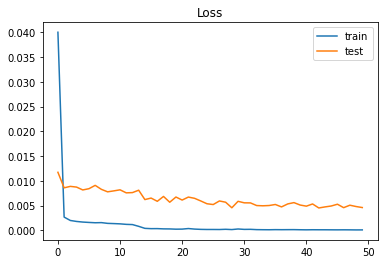

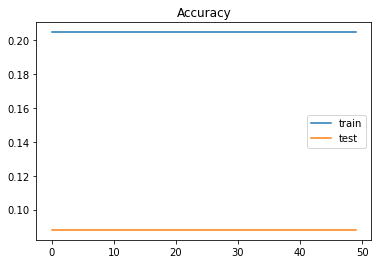

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

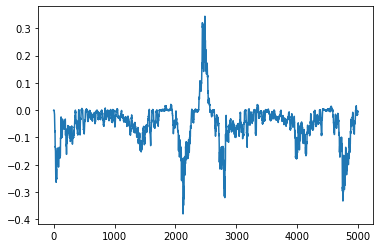

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_20.zip"' "/content/my_model.h5"

mkdir: cannot create directory ‘saved_model’: File exists
  adding: content/my_model.h5 (deflated 30%)


# Nvidia Model with Averaging filter = 30

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(30,labels)

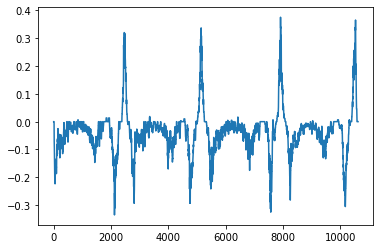

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 67s 144ms/step - loss: 0.0085 - acc: 0.1293 - val_loss: 0.0108 - val_acc: 0.0570
Epoch 2/50
40/40 [==============================] - 5s 117ms/step - loss: 0.0027 - acc: 0.1236 - val_loss: 0.0079 - val_acc: 0.0570
Epoch 3/50
40/40 [==============================] - 5s 118ms/step - loss: 0.0016 - acc: 0.1306 - val_loss: 0.0077 - val_acc: 0.0570
Epoch 4/50
40/40 [==============================] - 5s 117ms/step - loss: 0.0015 - acc: 0.1226 - val_loss: 0.0068 - val_acc: 0.0570
Epoch 5/50
40/40 [==============================] - 5s 118ms/step - loss: 0.0012 - acc: 0.1328 - val_loss: 0.0060 - val_acc: 0.0570
Epoch 6/50
40/40 [==============================] - 5s 117ms/step - loss: 0.0014 - acc: 0.1231 - val_loss: 0.0055 - val_acc: 0.0570
Epoch 7/50
40/40 [==============================] - 5s 118ms/step - loss: 0.0011 - acc: 0.1258 - val_loss: 0.0055 - val_acc: 0.0570
Epoch 8/50
40/40 [==============================] - 5s 118ms/step - loss: 0

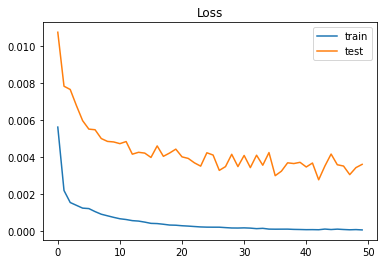

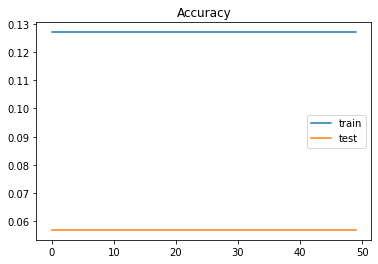

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

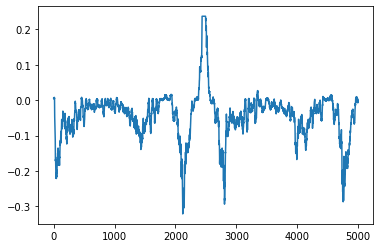

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_30.zip"' "/content/my_model.h5"

mkdir: cannot create directory ‘saved_model’: File exists
  adding: content/my_model.h5 (deflated 30%)


# Nvidia Model with Averaging filter = 40

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(40,labels)

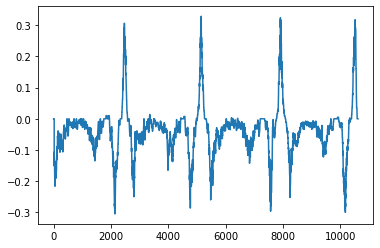

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 60s 134ms/step - loss: 0.0302 - acc: 0.0778 - val_loss: 0.0140 - val_acc: 0.0370
Epoch 2/50
40/40 [==============================] - 4s 105ms/step - loss: 0.0040 - acc: 0.0739 - val_loss: 0.0084 - val_acc: 0.0370
Epoch 3/50
40/40 [==============================] - 4s 105ms/step - loss: 0.0023 - acc: 0.0718 - val_loss: 0.0084 - val_acc: 0.0370
Epoch 4/50
40/40 [==============================] - 4s 105ms/step - loss: 0.0015 - acc: 0.0715 - val_loss: 0.0056 - val_acc: 0.0370
Epoch 5/50
40/40 [==============================] - 4s 106ms/step - loss: 6.6743e-04 - acc: 0.0777 - val_loss: 0.0055 - val_acc: 0.0370
Epoch 6/50
40/40 [==============================] - 4s 106ms/step - loss: 4.4491e-04 - acc: 0.0731 - val_loss: 0.0058 - val_acc: 0.0370
Epoch 7/50
40/40 [==============================] - 4s 106ms/step - loss: 3.5751e-04 - acc: 0.0801 - val_loss: 0.0059 - val_acc: 0.0370
Epoch 8/50
40/40 [==============================] - 4s 103ms/st

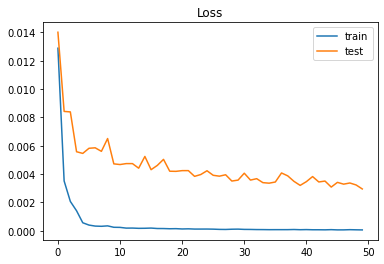

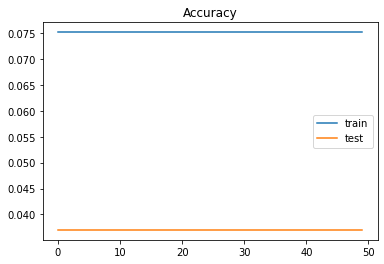

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

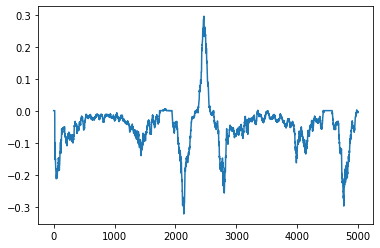

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_40.zip"' "/content/my_model.h5"

  adding: content/my_model.h5 (deflated 33%)


# Nvidia Model with Averaging filter = 50

# Nvidia Model with Averaging filter = 60

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(60,labels)

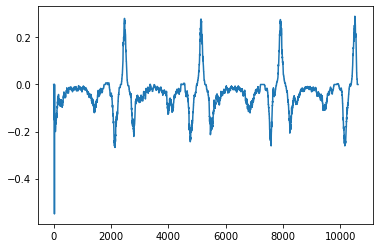

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 68s 154ms/step - loss: 0.0157 - acc: 0.0431 - val_loss: 0.0142 - val_acc: 0.0000e+00
Epoch 2/50
40/40 [==============================] - 5s 120ms/step - loss: 0.0040 - acc: 0.0418 - val_loss: 0.0097 - val_acc: 0.0000e+00
Epoch 3/50
40/40 [==============================] - 5s 120ms/step - loss: 0.0020 - acc: 0.0437 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 4/50
40/40 [==============================] - 5s 122ms/step - loss: 7.1642e-04 - acc: 0.0444 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 5/50
40/40 [==============================] - 5s 122ms/step - loss: 4.5223e-04 - acc: 0.0436 - val_loss: 0.0063 - val_acc: 0.0000e+00
Epoch 6/50
40/40 [==============================] - 5s 122ms/step - loss: 3.6293e-04 - acc: 0.0413 - val_loss: 0.0032 - val_acc: 0.0000e+00
Epoch 7/50
40/40 [==============================] - 5s 121ms/step - loss: 2.5177e-04 - acc: 0.0455 - val_loss: 0.0027 - val_acc: 0.0000e+00
Epoch 8/50
40/40 [=============

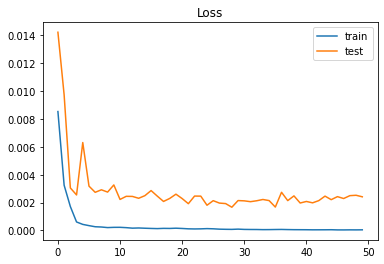

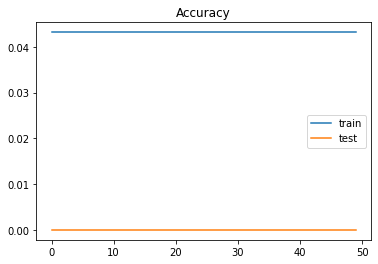

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

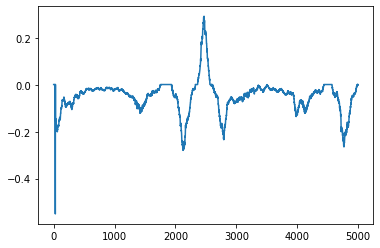

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_60.zip"' "/content/my_model.h5"

mkdir: cannot create directory ‘saved_model’: File exists
  adding: content/my_model.h5 (deflated 28%)


# Nvidia Model with Averaging filter = 70

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(70,labels)

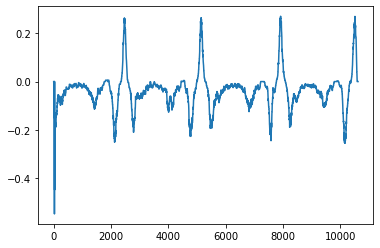

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 67s 144ms/step - loss: 0.3067 - acc: 0.0333 - val_loss: 0.0106 - val_acc: 0.0000e+00
Epoch 2/50
40/40 [==============================] - 4s 110ms/step - loss: 0.0029 - acc: 0.0336 - val_loss: 0.0077 - val_acc: 0.0000e+00
Epoch 3/50
40/40 [==============================] - 4s 110ms/step - loss: 4.9380e-04 - acc: 0.0337 - val_loss: 0.0109 - val_acc: 0.0000e+00
Epoch 4/50
40/40 [==============================] - 4s 112ms/step - loss: 5.9176e-04 - acc: 0.0326 - val_loss: 0.0051 - val_acc: 0.0000e+00
Epoch 5/50
40/40 [==============================] - 4s 109ms/step - loss: 4.0277e-04 - acc: 0.0392 - val_loss: 0.0045 - val_acc: 0.0000e+00
Epoch 6/50
40/40 [==============================] - 4s 111ms/step - loss: 2.4898e-04 - acc: 0.0333 - val_loss: 0.0045 - val_acc: 0.0000e+00
Epoch 7/50
40/40 [==============================] - 4s 111ms/step - loss: 3.1434e-04 - acc: 0.0337 - val_loss: 0.0025 - val_acc: 0.0000e+00
Epoch 8/50
40/40 [=========

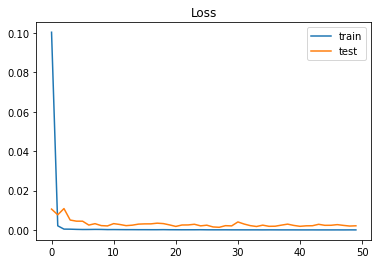

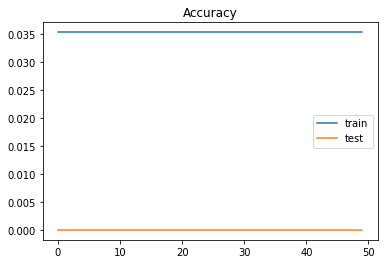

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

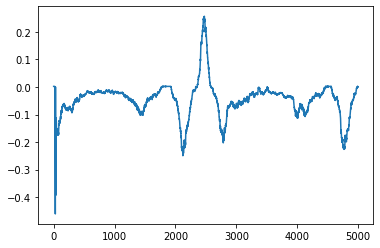

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_70.zip"' "/content/my_model.h5"

mkdir: cannot create directory ‘saved_model’: File exists
  adding: content/my_model.h5 (deflated 33%)


# Nvidia Model with Averaging filter = 80

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(80,labels)

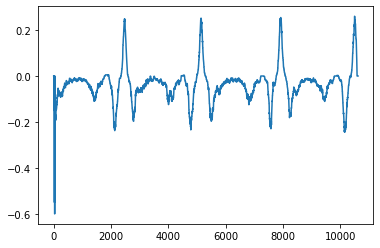

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 67s 143ms/step - loss: 0.0389 - acc: 0.0333 - val_loss: 0.0278 - val_acc: 0.0000e+00
Epoch 2/50
40/40 [==============================] - 5s 113ms/step - loss: 0.0050 - acc: 0.0262 - val_loss: 0.0070 - val_acc: 0.0000e+00
Epoch 3/50
40/40 [==============================] - 5s 115ms/step - loss: 0.0016 - acc: 0.0281 - val_loss: 0.0120 - val_acc: 0.0000e+00
Epoch 4/50
40/40 [==============================] - 5s 117ms/step - loss: 6.2496e-04 - acc: 0.0292 - val_loss: 0.0110 - val_acc: 0.0000e+00
Epoch 5/50
40/40 [==============================] - 5s 114ms/step - loss: 6.4125e-04 - acc: 0.0286 - val_loss: 0.0118 - val_acc: 0.0000e+00
Epoch 6/50
40/40 [==============================] - 5s 113ms/step - loss: 4.5460e-04 - acc: 0.0267 - val_loss: 0.0118 - val_acc: 0.0000e+00
Epoch 7/50
40/40 [==============================] - 5s 114ms/step - loss: 3.1457e-04 - acc: 0.0276 - val_loss: 0.0110 - val_acc: 0.0000e+00
Epoch 8/50
40/40 [=============

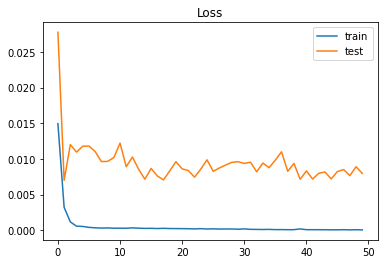

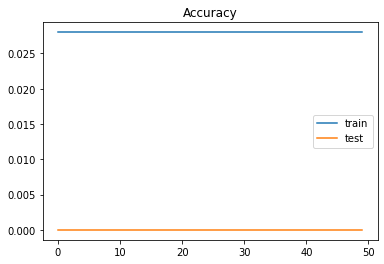

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

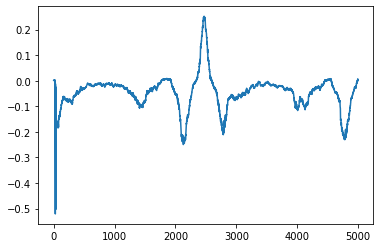

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_80.zip"' "/content/my_model.h5"

mkdir: cannot create directory ‘saved_model’: File exists
  adding: content/my_model.h5 (deflated 36%)


# Nvidia Model with Averaging filter = 90

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(90,labels)

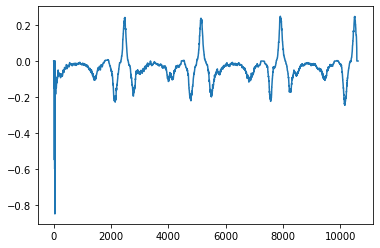

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 62s 141ms/step - loss: 0.0140 - acc: 0.0228 - val_loss: 0.0093 - val_acc: 0.0000e+00
Epoch 2/50
40/40 [==============================] - 4s 112ms/step - loss: 0.0026 - acc: 0.0206 - val_loss: 0.0057 - val_acc: 0.0000e+00
Epoch 3/50
40/40 [==============================] - 5s 114ms/step - loss: 0.0011 - acc: 0.0224 - val_loss: 0.0087 - val_acc: 0.0000e+00
Epoch 4/50
40/40 [==============================] - 5s 114ms/step - loss: 5.5300e-04 - acc: 0.0196 - val_loss: 0.0100 - val_acc: 0.0000e+00
Epoch 5/50
40/40 [==============================] - 5s 114ms/step - loss: 6.0209e-04 - acc: 0.0194 - val_loss: 0.0101 - val_acc: 0.0000e+00
Epoch 6/50
40/40 [==============================] - 5s 113ms/step - loss: 5.4841e-04 - acc: 0.0175 - val_loss: 0.0073 - val_acc: 0.0000e+00
Epoch 7/50
40/40 [==============================] - 5s 113ms/step - loss: 3.8826e-04 - acc: 0.0192 - val_loss: 0.0080 - val_acc: 0.0000e+00
Epoch 8/50
40/40 [=============

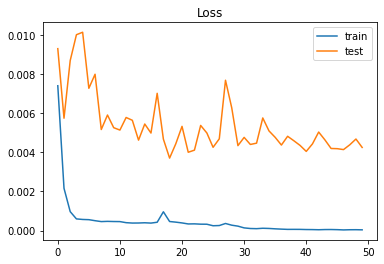

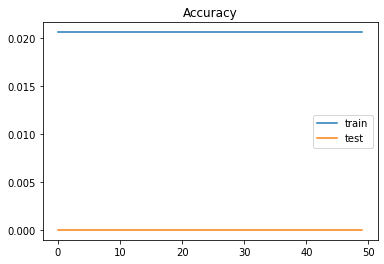

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

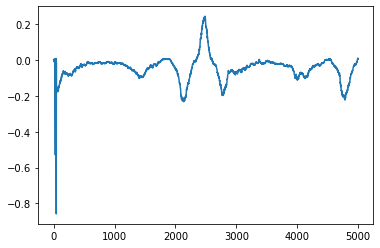

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_90.zip"' "/content/my_model.h5"

  adding: content/my_model.h5 (deflated 31%)


# Nvidia Model with Averaging filter = 100

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(100,labels)

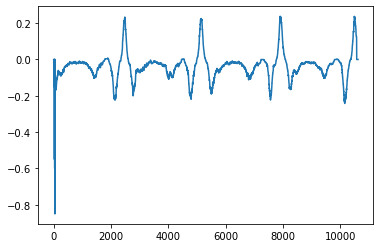

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 69s 149ms/step - loss: 0.0243 - acc: 0.0132 - val_loss: 0.0091 - val_acc: 0.0000e+00
Epoch 2/50
40/40 [==============================] - 5s 119ms/step - loss: 0.0025 - acc: 0.0140 - val_loss: 0.0041 - val_acc: 0.0000e+00
Epoch 3/50
40/40 [==============================] - 5s 119ms/step - loss: 9.2086e-04 - acc: 0.0173 - val_loss: 0.0054 - val_acc: 0.0000e+00
Epoch 4/50
40/40 [==============================] - 5s 118ms/step - loss: 6.8208e-04 - acc: 0.0139 - val_loss: 0.0031 - val_acc: 0.0000e+00
Epoch 5/50
40/40 [==============================] - 5s 119ms/step - loss: 3.9708e-04 - acc: 0.0152 - val_loss: 0.0036 - val_acc: 0.0000e+00
Epoch 6/50
40/40 [==============================] - 5s 120ms/step - loss: 4.6944e-04 - acc: 0.0142 - val_loss: 0.0035 - val_acc: 0.0000e+00
Epoch 7/50
40/40 [==============================] - 5s 120ms/step - loss: 6.5137e-04 - acc: 0.0118 - val_loss: 0.0040 - val_acc: 0.0000e+00
Epoch 8/50
40/40 [=========

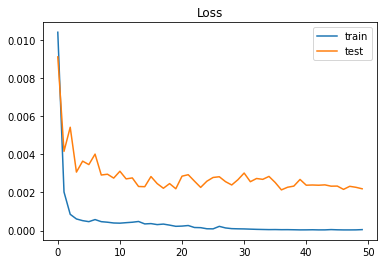

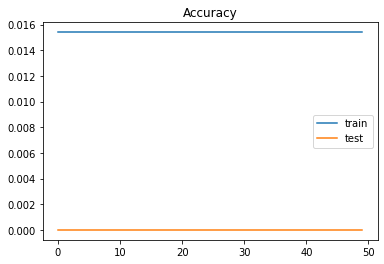

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

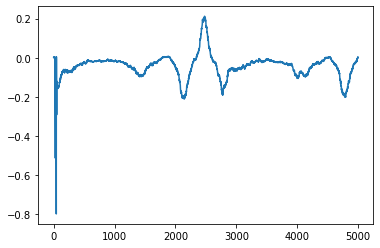

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_100.zip"' "/content/my_model.h5"

  adding: content/my_model.h5 (deflated 32%)


# LibrARIES

In [ ]:
import math
from keras.utils import np_utils
from sklearn import preprocessing
from sklearn.utils import class_weight as cw
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.svm import LinearSVC, SVC
from sklearn import metrics 
import keras
from scipy import misc,ndimage
from keras import models
from keras.layers import Dense
from keras.regularizers import l2
from keras.models import Model
from keras.models import Sequential
from keras.layers import Convolution1D, concatenate, SpatialDropout1D, GlobalMaxPool1D, GlobalAvgPool1D, Embedding, Conv2D, SeparableConv1D, Add, BatchNormalization, Reshape, Activation, GlobalAveragePooling2D, LeakyReLU, Flatten, Conv2DTranspose
from keras.layers import Dense, Input, Dropout, MaxPooling2D, Concatenate, GlobalMaxPooling2D, GlobalAveragePooling2D, Lambda, Multiply, LSTM, Bidirectional, PReLU, MaxPooling1D, UpSampling2D
from keras.applications.densenet import DenseNet201
from keras.applications.nasnet import NASNetMobile, NASNetLarge
from keras.applications.nasnet import preprocess_input
from keras import optimizers
from keras.optimizers import Adam, SGD , RMSprop
from keras.losses import mae, sparse_categorical_crossentropy, binary_crossentropy
from keras import backend as K
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.image as mpimg
import seaborn as sns
import cv2
from PIL import Image
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from skimage import color
from skimage.feature import hog
from sklearn import svm
from sklearn.metrics import classification_report,accuracy_score
from sklearn import metrics
from skimage import data, exposure
from keras import models
from keras import layers
from keras.datasets import cifar10
import matplotlib.pyplot as plt
#from keras.utils import to_categorical
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, LSTM, TimeDistributed
from keras.layers.normalization import BatchNormalization
from keras.layers.advanced_activations import LeakyReLU
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input



# upPLOAD

In [ ]:
#download
!pip install -q kaggle
!mkdir ~/.kaggle
!wget https://raw.githubusercontent.com/ms03831/cv_a2/main/kaggle.json
!mv kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d zaynena/selfdriving-car-simulator

mkdir: cannot create directory ‘/root/.kaggle’: File exists
--2021-05-30 12:56:12--  https://raw.githubusercontent.com/ms03831/cv_a2/main/kaggle.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70 [text/plain]
Saving to: ‘kaggle.json’

kaggle.json         100%[===================>]      70  --.-KB/s    in 0s      

2021-05-30 12:56:12 (4.52 MB/s) - ‘kaggle.json’ saved [70/70]

selfdriving-car-simulator.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
#setup directories
!mkdir Project

mkdir: cannot create directory ‘Project’: File exists


In [ ]:
#unzip
import shutil
shutil.unpack_archive("/content/selfdriving-car-simulator.zip", "/content/Project")

In [ ]:
# we only need the train images 
!rm -r /content/Project/dataset/
!rm -r /content/Project/track2data/

In [ ]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator

data = ImageDataGenerator(rescale=1./255)

data_generator = data.flow_from_directory(
        '/content/Project',target_size=(160, 320), batch_size=10000, shuffle = False)

Found 31845 images belonging to 1 classes.


In [ ]:
images, _ = next(iter(data_generator))


In [ ]:
images = [y for x in [images[2000:3000], images[4500:6000]] for y in x]

In [ ]:
images = np.array(images)
images.shape

(2500, 160, 320, 3)

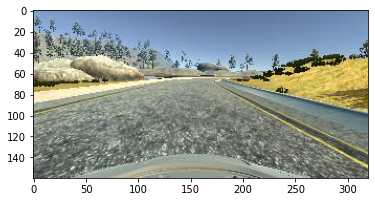

In [ ]:
plt.imshow(images[1500])

In [ ]:
### CHANGE COLUMN TO THE STEERING ANGLE ONE AND VERIFY ####################
### I DONT REMEMBER WHICH COLUMN IT WAS  #################################
### Ignore above comments###
import pandas as pd
df1 = pd.read_csv('/content/Project/track1data/track1data/driving_log.csv',usecols=[3])

In [ ]:
type(df1)

pandas.core.frame.DataFrame

In [ ]:
print(df1)

         0
0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
...    ...
10609  0.0
10610  0.0
10611  0.0
10612  0.0
10613  0.0

[10614 rows x 1 columns]


In [ ]:
labels = np.array(df1)
#labels = labels[:2000]
labels = [y for x in [labels[2000:3000], labels[4500:6000]] for y in x]
labels = np.array(labels)

In [ ]:
print(labels[:50])

[[ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [-0.05     ]
 [-0.2      ]
 [-0.4      ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [-0.1      ]
 [-0.25     ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [-0.15     ]
 [-0.35     ]
 [-0.5000001]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]
 [ 0.       ]]


In [ ]:
type(labels[0,0])

numpy.float64

In [ ]:
del data
del data_generator

# FUnctions

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS = 32, 32, 3
INPUT_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS)
def crop(image):
    """
    Crop the image (removing the sky at the top and the car front at the bottom)
    """
    return image[60:-25, :, :] # remove the sky and the car front


def resize(image):
    """
    Resize the image to the input shape used by the network model
    """
    return cv2.resize(image, (IMAGE_WIDTH, IMAGE_HEIGHT), cv2.INTER_AREA)


def rgb2yuv(image):
    """
    Convert the image from RGB to YUV (This is what the NVIDIA model does)
    """
    return cv2.cvtColor(image, cv2.COLOR_RGB2YUV)


def preprocess(image): #This function directly calls the above 3 functions all together. ISS SE NEECHAY FUNCTIONS I HAVE NOT APPLIED YET
    """
    Combine all preprocess functions into one
    """
    image = crop(image)
    #image = resize(image)
    #image = rgb2yuv(image)
    return image

In [ ]:
def preprocess_LSTM_images(N,T):
  pp_images=[]
   #datsize
  for i in range(T):
    pp_images.append(preprocess(images[i]))
  pp_images = np.array(pp_images)
  print("Total set = ", pp_images.shape)
  input_images = []
  temp = []
  for i in range(T-N):
    temp=[]
    for i in range(N):
      temp.append(pp_images[i+N])
    input_images.append(temp)
  input_images = np.array(input_images)
  print("New images =", input_images.shape)
  return input_images

In [ ]:
def test_train_split(train_size, test_size):
  x_train = []
  x_test = []
  y_train = []
  y_test = []

  for i in range(train_size):
    x_train.append(input_images[i].astype('float32'))
    y_train.append(avg_labels[i].astype('float32'))

  for i in range(train_size,train_size+test_size):
    x_test.append(input_images[i].astype('float32'))
    y_test.append(avg_labels[i].astype('float32'))

  x_train = np.array(x_train)
  x_test = np.array(x_test)
  y_train = np.array(y_train)
  y_test = np.array(y_test)
  print("x_train: ", x_train.shape)
  print("y_train: ", y_train.shape)
  print("x_test: ", x_test.shape)
  print("y_test: ", y_test.shape)
  return x_train, x_test, y_train, y_test

# 2. N = 5 - LSTM

**Do all preprocessing functions first**

In [ ]:
avg_labels = Preprocess_Labels_filter(40,labels) #l=40  FIlter Param

In [ ]:
input_images = preprocess_LSTM_images(5,2500) # N=5, T=5000 LSTM param

Total set =  (2500, 75, 320, 3)
New images = (2495, 5, 75, 320, 3)


In [ ]:
del images

In [ ]:
del labels

In [ ]:
x_train, x_test, y_train, y_test=test_train_split(2000, 495)
del input_images
del avg_labels

x_train:  (2000, 5, 75, 320, 3)
y_train:  (2000, 1)
x_test:  (495, 5, 75, 320, 3)
y_test:  (495, 1)


***build model: First build convnet used for feature extraction***

In [ ]:
from keras.layers import Conv2D, BatchNormalization, MaxPool2D, GlobalMaxPool2D
def build_convnet(shape=(75, 320, 3)):
    model = Sequential()
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    
    # flatten...
    # model.add(GlobalMaxPool2D())
    return model


***Now build GRU + dense model. GRU is similar to LSTM but less efficient and consumes less memory***

In [ ]:
from keras.layers import TimeDistributed, GRU, Dense, Dropout
def action_model(shape=(5, 75, 320, 3), nbout=1):
    convnet = build_convnet(shape[1:])
    
    # then create our final model
    model = keras.Sequential()
    # add the convnet with (5, 112, 112, 3) shape
    model.add(TimeDistributed(convnet, input_shape=shape))
    
    # here, you can also use GRU or LSTM
    model.add(LSTM(64))


    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    return model

The model takes multiple (5) images as input, to capture temporal info as explained previously

In [ ]:
SIZE = (75, 320)
CHANNELS = 3
NBFRAME = 5
BS = 8
classes = [1]
INSHAPE=(NBFRAME,) + SIZE + (CHANNELS,)
model = action_model(INSHAPE, len(classes))
optimizer = 'adamax'
model.compile(
    optimizer,
    'mse',
    metrics=['acc']
)

In [ ]:
model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed_3 (TimeDist (None, 5, 4224)           131348    
_________________________________________________________________
lstm_1 (LSTM)                (None, 64)                1097984   
_________________________________________________________________
dense_12 (Dense)             (None, 100)               6500      
_________________________________________________________________
dense_13 (Dense)             (None, 50)                5050      
_________________________________________________________________
dense_14 (Dense)             (None, 10)                510       
_________________________________________________________________
dense_15 (Dense)             (None, 1)                 11        
Total params: 1,241,403
Trainable params: 1,241,403
Non-trainable params: 0
____________________________________________

In [ ]:
history = model.fit(x_train, y_train,batch_size=128,epochs=10, validation_data=(x_test,y_test))

Epoch 1/10
16/16 [==============================] - 90s 5s/step - loss: 0.0150 - acc: 0.0912 - val_loss: 0.0039 - val_acc: 0.0263
Epoch 2/10
16/16 [==============================] - 90s 6s/step - loss: 0.0139 - acc: 0.0927 - val_loss: 0.0034 - val_acc: 0.0263
Epoch 3/10
16/16 [==============================] - 85s 5s/step - loss: 0.0141 - acc: 0.0923 - val_loss: 0.0038 - val_acc: 0.0263
Epoch 4/10
16/16 [==============================] - 85s 5s/step - loss: 0.0142 - acc: 0.0921 - val_loss: 0.0033 - val_acc: 0.0263
Epoch 5/10
16/16 [==============================] - 85s 5s/step - loss: 0.0144 - acc: 0.0910 - val_loss: 0.0035 - val_acc: 0.0263
Epoch 6/10
16/16 [==============================] - 85s 5s/step - loss: 0.0132 - acc: 0.0905 - val_loss: 0.0042 - val_acc: 0.0263
Epoch 7/10
16/16 [==============================] - 85s 5s/step - loss: 0.0143 - acc: 0.0845 - val_loss: 0.0038 - val_acc: 0.0263
Epoch 8/10
16/16 [==============================] - 85s 5s/step - loss: 0.0148 - acc: 0.08

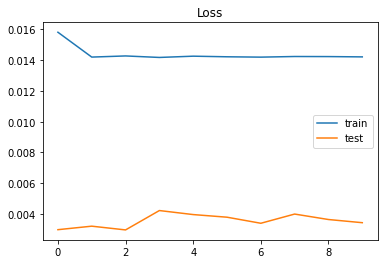

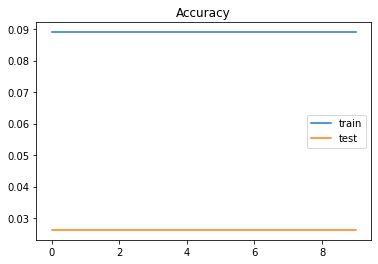

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

In [ ]:
predictions = model.predict(x_test)

In [ ]:
for x in y_train:
  print(x)

[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[-0.025]
[-0.025]
[-0.02875]
[-0.0375]
[-0.05]
[-0.05]
[-0.05]
[-0.05]
[-0.05]
[-0.05]
[-0.05125]
[-0.0575]
[-0.0575]
[-0.0575]
[-0.0575]
[-0.0575]
[-0.06]
[-0.06625]
[-0.0775]
[-0.09250001]
[-0.09250001]
[-0.09125]
[-0.08625001]
[-0.07625]
[-0.07625]
[-0.07750001]
[-0.08375]
[-0.09375001]
[-0.09375001]
[-0.09375001]
[-0.09375001]
[-0.09375001]
[-0.09625001]
[-0.1]
[-0.105]
[-0.12]
[-0.12]
[-0.12]
[-0.12]
[-0.12]
[-0.12]
[-0.12]
[-0.11625001]
[-0.11000001]
[-0.105]
[-0.11750001]
[-0.11750001]
[-0.11750001]
[-0.11750001]
[-0.11750001]
[-0.11625001]
[-0.11375001]
[-0.12250001]
[-0.13625]
[-0.15375002]
[-0.15375002]
[-0.15125]
[-0.14500001]
[-0.13375]
[-0.11875001]
[-0.11875001]
[-0.12375001]
[-0.13250001]
[-0.14625001]
[-0.14625001]
[-0.14500001]
[-0.14125001]
[-0.13875002]
[-0.15]
[-0.16625]
[-0.18750001]
[-0.18750001]
[-0.18500002]
[-0.17875001]
[-0.16750002]
[-0.15250002]
[-0.15375002]


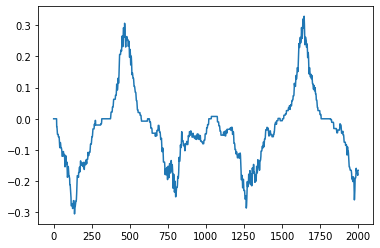

In [ ]:
plt.plot(y_train)

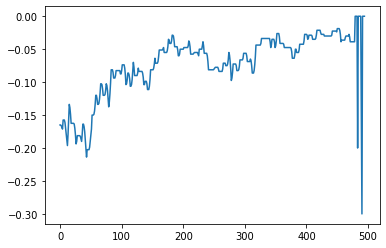

In [ ]:
plt.plot(y_test)

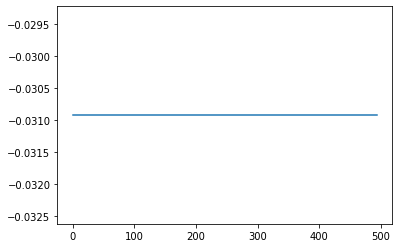

In [ ]:
plt.plot(predictions)

In [ ]:
history = model.fit(x_train, y_train,batch_size=32,epochs=3, validation_data=(x_test,y_test))

In [ ]:
a = np.array([x_train[18], x_train[19], x_train[20]])
x = model.predict(a)

In [ ]:
print(x[0])
print(x[1])
print(x[2])

[0.]
[0.]
[0.]


In [ ]:
labels[18]

array([0.])

In [ ]:
labels[19]

array([-0.15])

In [ ]:
n=0
for i in range(10000):
  if labels[i,0]>0:
    break
  n = n+1  


In [ ]:
print(n)

848


In [ ]:
labels[848]

array([0.2])

In [ ]:
a = np.array([x_train[848]])
x = model.predict(a)

In [ ]:
print(x)

[[0.]]


In [ ]:
a = np.array(x_test)
x = model.predict(a)

In [ ]:
np.max(x)

0.0

In [ ]:
np.min(x)

0.0

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(50,labels)

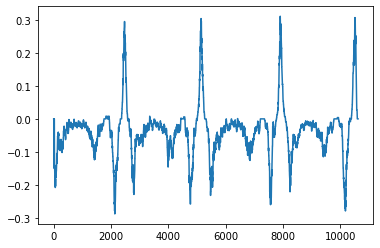

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 67s 144ms/step - loss: 0.0058 - acc: 0.0504 - val_loss: 0.0077 - val_acc: 0.0170
Epoch 2/50
40/40 [==============================] - 5s 115ms/step - loss: 0.0020 - acc: 0.0509 - val_loss: 0.0044 - val_acc: 0.0170
Epoch 3/50
40/40 [==============================] - 5s 116ms/step - loss: 4.9151e-04 - acc: 0.0480 - val_loss: 0.0043 - val_acc: 0.0170
Epoch 4/50
40/40 [==============================] - 5s 117ms/step - loss: 2.5820e-04 - acc: 0.0539 - val_loss: 0.0025 - val_acc: 0.0170
Epoch 5/50
40/40 [==============================] - 5s 115ms/step - loss: 2.3670e-04 - acc: 0.0515 - val_loss: 0.0034 - val_acc: 0.0170
Epoch 6/50
40/40 [==============================] - 4s 113ms/step - loss: 2.0060e-04 - acc: 0.0519 - val_loss: 0.0035 - val_acc: 0.0170
Epoch 7/50
40/40 [==============================] - 5s 118ms/step - loss: 2.1613e-04 - acc: 0.0514 - val_loss: 0.0028 - val_acc: 0.0170
Epoch 8/50
40/40 [==============================] - 5s 

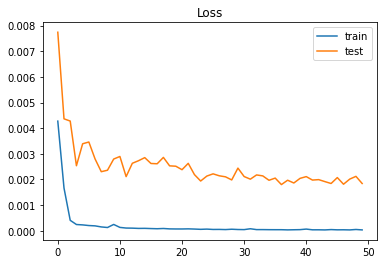

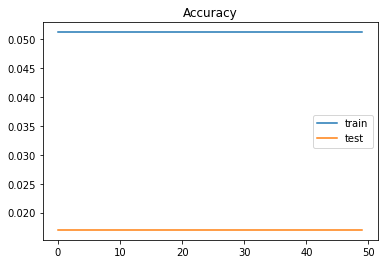

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

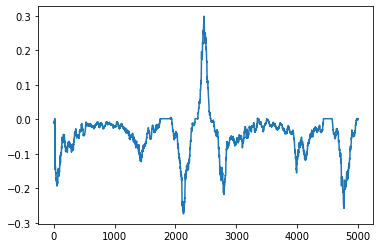

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_50.zip"' "/content/my_model.h5"

mkdir: cannot create directory ‘saved_model’: File exists
  adding: content/my_model.h5 (deflated 29%)


# 2. N = 10 - LSTM


**Do all preprocessing functions first**

In [ ]:
avg_labels = Preprocess_Labels_filter(40,labels) #l=40  FIlter Param

In [ ]:
input_images = preprocess_LSTM_images(7,2000) # N=5, T=5000 LSTM param

Total set =  (2500, 75, 320, 3)
New images = (2493, 7, 75, 320, 3)


In [ ]:
del images

In [ ]:
del labels

In [ ]:
x_train, x_test, y_train, y_test=test_train_split(1500, 493)
del input_images
del avg_labels

***build model: First build convnet used for feature extraction***

In [ ]:
from keras.layers import Conv2D, BatchNormalization, MaxPool2D, GlobalMaxPool2D
def build_convnet(shape=(75, 320, 3)):
    model = Sequential()
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    
    # flatten...
    # model.add(GlobalMaxPool2D())
    return model


***Now build GRU + dense model. GRU is similar to LSTM but less efficient and consumes less memory***

In [ ]:
from keras.layers import TimeDistributed, GRU, Dense, Dropout
def action_model(shape=(5, 75, 320, 3), nbout=1):
    convnet = build_convnet(shape[1:])
    
    # then create our final model
    model = keras.Sequential()
    # add the convnet with (5, 112, 112, 3) shape
    model.add(TimeDistributed(convnet, input_shape=shape))
    
    # here, you can also use GRU or LSTM
    model.add(LSTM(64))


    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    return model

The model takes multiple (5) images as input, to capture temporal info as explained previously

In [ ]:
SIZE = (75, 320)
CHANNELS = 3
NBFRAME = 5
BS = 8
classes = [1]
INSHAPE=(NBFRAME,) + SIZE + (CHANNELS,)
model = action_model(INSHAPE, len(classes))
optimizer = 'adamax'
model.compile(
    optimizer,
    'mse',
    metrics=['acc']
)

In [ ]:
model.summary()

In [ ]:
history = model.fit(x_train, y_train,batch_size=128,epochs=10, validation_data=(x_test,y_test))

Epoch 1/10
16/16 [==============================] - 90s 5s/step - loss: 0.0150 - acc: 0.0912 - val_loss: 0.0039 - val_acc: 0.0263
Epoch 2/10
16/16 [==============================] - 90s 6s/step - loss: 0.0139 - acc: 0.0927 - val_loss: 0.0034 - val_acc: 0.0263
Epoch 3/10
16/16 [==============================] - 85s 5s/step - loss: 0.0141 - acc: 0.0923 - val_loss: 0.0038 - val_acc: 0.0263
Epoch 4/10
16/16 [==============================] - 85s 5s/step - loss: 0.0142 - acc: 0.0921 - val_loss: 0.0033 - val_acc: 0.0263
Epoch 5/10
16/16 [==============================] - 85s 5s/step - loss: 0.0144 - acc: 0.0910 - val_loss: 0.0035 - val_acc: 0.0263
Epoch 6/10
16/16 [==============================] - 85s 5s/step - loss: 0.0132 - acc: 0.0905 - val_loss: 0.0042 - val_acc: 0.0263
Epoch 7/10
16/16 [==============================] - 85s 5s/step - loss: 0.0143 - acc: 0.0845 - val_loss: 0.0038 - val_acc: 0.0263
Epoch 8/10
16/16 [==============================] - 85s 5s/step - loss: 0.0148 - acc: 0.08

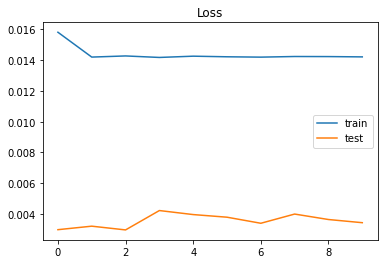

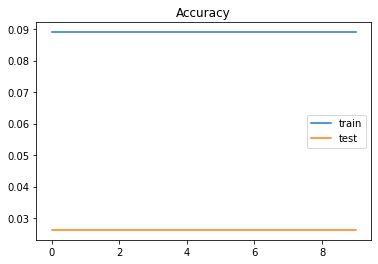

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

In [ ]:
predictions = model.predict(x_test)

In [ ]:
for x in y_train:
  print(x)

[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[0.]
[-0.025]
[-0.025]
[-0.02875]
[-0.0375]
[-0.05]
[-0.05]
[-0.05]
[-0.05]
[-0.05]
[-0.05]
[-0.05125]
[-0.0575]
[-0.0575]
[-0.0575]
[-0.0575]
[-0.0575]
[-0.06]
[-0.06625]
[-0.0775]
[-0.09250001]
[-0.09250001]
[-0.09125]
[-0.08625001]
[-0.07625]
[-0.07625]
[-0.07750001]
[-0.08375]
[-0.09375001]
[-0.09375001]
[-0.09375001]
[-0.09375001]
[-0.09375001]
[-0.09625001]
[-0.1]
[-0.105]
[-0.12]
[-0.12]
[-0.12]
[-0.12]
[-0.12]
[-0.12]
[-0.12]
[-0.11625001]
[-0.11000001]
[-0.105]
[-0.11750001]
[-0.11750001]
[-0.11750001]
[-0.11750001]
[-0.11750001]
[-0.11625001]
[-0.11375001]
[-0.12250001]
[-0.13625]
[-0.15375002]
[-0.15375002]
[-0.15125]
[-0.14500001]
[-0.13375]
[-0.11875001]
[-0.11875001]
[-0.12375001]
[-0.13250001]
[-0.14625001]
[-0.14625001]
[-0.14500001]
[-0.14125001]
[-0.13875002]
[-0.15]
[-0.16625]
[-0.18750001]
[-0.18750001]
[-0.18500002]
[-0.17875001]
[-0.16750002]
[-0.15250002]
[-0.15375002]


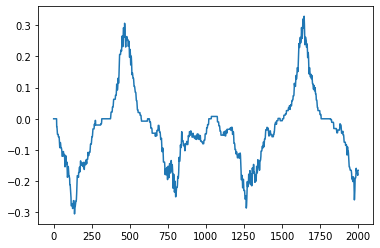

In [ ]:
plt.plot(y_train)

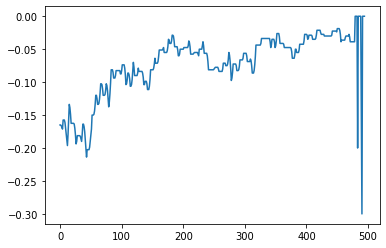

In [ ]:
plt.plot(y_test)

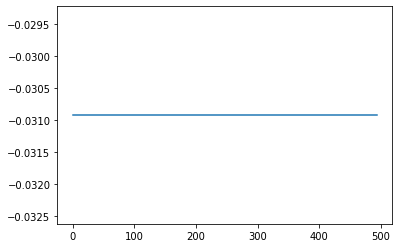

In [ ]:
plt.plot(predictions)

In [ ]:
history = model.fit(x_train, y_train,batch_size=32,epochs=3, validation_data=(x_test,y_test))

In [ ]:
a = np.array([x_train[18], x_train[19], x_train[20]])
x = model.predict(a)

In [ ]:
print(x[0])
print(x[1])
print(x[2])

[0.]
[0.]
[0.]


In [ ]:
labels[18]

array([0.])

In [ ]:
labels[19]

array([-0.15])

In [ ]:
n=0
for i in range(10000):
  if labels[i,0]>0:
    break
  n = n+1  


In [ ]:
print(n)

848


In [ ]:
labels[848]

array([0.2])

In [ ]:
a = np.array([x_train[848]])
x = model.predict(a)

In [ ]:
print(x)

[[0.]]


In [ ]:
a = np.array(x_test)
x = model.predict(a)

In [ ]:
np.max(x)

0.0

In [ ]:
np.min(x)

0.0

In [ ]:
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20


In [ ]:
avg_labels = Preprocess_Labels_filter(50,labels)

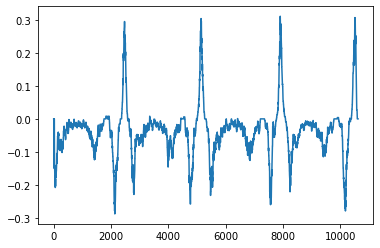

In [ ]:
plt.plot(avg_labels)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
x_train = []
x_test = []

for x in range(5000): # 8613
  x_train.append(images[x])

for x in range(1000): # 2000
  x_test.append(images[x+7500])

In [ ]:
del images

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del avg_labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
40/40 [==============================] - 67s 144ms/step - loss: 0.0058 - acc: 0.0504 - val_loss: 0.0077 - val_acc: 0.0170
Epoch 2/50
40/40 [==============================] - 5s 115ms/step - loss: 0.0020 - acc: 0.0509 - val_loss: 0.0044 - val_acc: 0.0170
Epoch 3/50
40/40 [==============================] - 5s 116ms/step - loss: 4.9151e-04 - acc: 0.0480 - val_loss: 0.0043 - val_acc: 0.0170
Epoch 4/50
40/40 [==============================] - 5s 117ms/step - loss: 2.5820e-04 - acc: 0.0539 - val_loss: 0.0025 - val_acc: 0.0170
Epoch 5/50
40/40 [==============================] - 5s 115ms/step - loss: 2.3670e-04 - acc: 0.0515 - val_loss: 0.0034 - val_acc: 0.0170
Epoch 6/50
40/40 [==============================] - 4s 113ms/step - loss: 2.0060e-04 - acc: 0.0519 - val_loss: 0.0035 - val_acc: 0.0170
Epoch 7/50
40/40 [==============================] - 5s 118ms/step - loss: 2.1613e-04 - acc: 0.0514 - val_loss: 0.0028 - val_acc: 0.0170
Epoch 8/50
40/40 [==============================] - 5s 

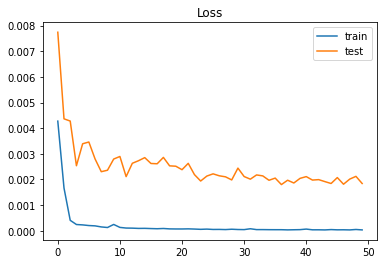

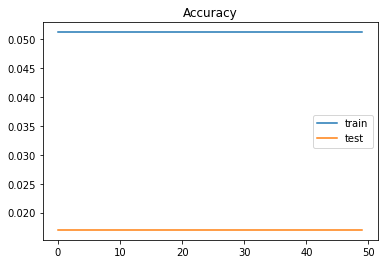

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

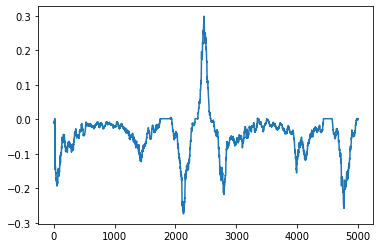

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_50.zip"' "/content/my_model.h5"

mkdir: cannot create directory ‘saved_model’: File exists
  adding: content/my_model.h5 (deflated 29%)


# Better Model


In [ ]:
import math
from keras.utils import np_utils
from sklearn import preprocessing
from sklearn.utils import class_weight as cw
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.svm import LinearSVC, SVC
from sklearn import metrics 
import keras
from scipy import misc,ndimage
from keras import models
from keras.layers import Dense
from keras.regularizers import l2
from keras.models import Model
from keras.models import Sequential
from keras.layers import Convolution1D, concatenate, SpatialDropout1D, GlobalMaxPool1D, GlobalAvgPool1D, Embedding, Conv2D, SeparableConv1D, Add, BatchNormalization, Reshape, Activation, GlobalAveragePooling2D, LeakyReLU, Flatten, Conv2DTranspose
from keras.layers import Dense, Input, Dropout, MaxPooling2D, Concatenate, GlobalMaxPooling2D, GlobalAveragePooling2D, Lambda, Multiply, LSTM, Bidirectional, PReLU, MaxPooling1D, UpSampling2D
from keras.applications.densenet import DenseNet201
from keras.applications.nasnet import NASNetMobile, NASNetLarge
from keras.applications.nasnet import preprocess_input
from keras import optimizers
from keras.optimizers import Adam, SGD , RMSprop
from keras.losses import mae, sparse_categorical_crossentropy, binary_crossentropy
from keras import backend as K
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.image as mpimg
import seaborn as sns
import cv2
from PIL import Image
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from skimage import color
from skimage.feature import hog
from sklearn import svm
from sklearn.metrics import classification_report,accuracy_score
from sklearn import metrics
from skimage import data, exposure
from keras import models
from keras import layers
from keras.datasets import cifar10
import matplotlib.pyplot as plt
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, LSTM, TimeDistributed
from keras.layers.normalization import BatchNormalization
from keras.layers.advanced_activations import LeakyReLU
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.layers import TimeDistributed, GRU, Dense, Dropout


# upPLOAD

In [ ]:
!pip install -q kaggle
!mkdir ~/.kaggle
!wget https://raw.githubusercontent.com/ms03831/cv_a2/main/kaggle.json
!mv kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d zaynena/selfdriving-car-simulator

mkdir: cannot create directory ‘/root/.kaggle’: File exists
--2021-05-31 09:11:28--  https://raw.githubusercontent.com/ms03831/cv_a2/main/kaggle.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70 [text/plain]
Saving to: ‘kaggle.json’

kaggle.json         100%[===================>]      70  --.-KB/s    in 0s      

2021-05-31 09:11:28 (3.43 MB/s) - ‘kaggle.json’ saved [70/70]

selfdriving-car-simulator.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
#setup directories
!mkdir Project

mkdir: cannot create directory ‘Project’: File exists


In [ ]:
#unzip
import shutil
shutil.unpack_archive("/content/selfdriving-car-simulator.zip", "/content/Project")

In [ ]:
# we only need the train images 
!rm -r /content/Project/dataset/
!rm -r /content/Project/track2data/

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

data = ImageDataGenerator(rescale=1./255)

data_generator = data.flow_from_directory(
        '/content/Project',target_size=(160, 320), batch_size=10613, shuffle = False)

Found 31845 images belonging to 1 classes.


In [ ]:
images, _ = next(iter(data_generator))
images.shape

(10613, 160, 320, 3)

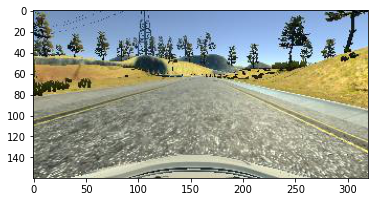

In [ ]:
plt.imshow(images[10612])

In [ ]:
import pandas as pd
df1 = pd.read_csv('/content/Project/track1data/track1data/driving_log.csv',usecols=[3])

In [ ]:
labels = np.array(df1)

In [ ]:
import cv2, os
import numpy as np
import matplotlib.image as mpimg


IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS = 66, 200, 3
INPUT_SHAPE = (IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS)


def load_image(data_dir, image_file):
    """
    Load RGB images from a file
    """
    return mpimg.imread(os.path.join(data_dir, image_file.strip()))


def crop(image):
    """
    Crop the image (removing the sky at the top and the car front at the bottom)
    """
    return image[60:-25, :, :] # remove the sky and the car front


def resize(image):
    """
    Resize the image to the input shape used by the network model
    """
    return cv2.resize(image, (IMAGE_WIDTH, IMAGE_HEIGHT), cv2.INTER_AREA)


def rgb2yuv(image):
    """
    Convert the image from RGB to YUV (This is what the NVIDIA model does)
    """
    return cv2.cvtColor(image, cv2.COLOR_RGB2YUV)


def preprocess(image): #This function directly calls the above 3 functions all together. ISS SE NEECHAY FUNCTIONS I HAVE NOT APPLIED YET
    """
    Combine all preprocess functions into one
    """
    image = crop(image)
    image = resize(image)
    image = rgb2yuv(image)
    return image


def choose_image(data_dir, center, left, right, steering_angle):
    """
    Randomly choose an image from the center, left or right, and adjust
    the steering angle.
    """
    choice = np.random.choice(3)
    if choice == 0:
        return load_image(data_dir, left), steering_angle + 0.2
    elif choice == 1:
        return load_image(data_dir, right), steering_angle - 0.2
    return load_image(data_dir, center), steering_angle


def random_flip(image, steering_angle):
    """
    Randomly flipt the image left <-> right, and adjust the steering angle.
    """
    if np.random.rand() < 0.5:
        image = cv2.flip(image, 1)
        steering_angle = -steering_angle
    return image, steering_angle


def random_translate(image, steering_angle, range_x, range_y):
    """
    Randomly shift the image virtially and horizontally (translation).
    """
    trans_x = range_x * (np.random.rand() - 0.5)
    trans_y = range_y * (np.random.rand() - 0.5)
    steering_angle += trans_x * 0.002
    trans_m = np.float32([[1, 0, trans_x], [0, 1, trans_y]])
    height, width = image.shape[:2]
    image = cv2.warpAffine(image, trans_m, (width, height))
    return image, steering_angle


def random_shadow(image):
    """
    Generates and adds random shadow
    """
    # (x1, y1) and (x2, y2) forms a line
    # xm, ym gives all the locations of the image
    x1, y1 = IMAGE_WIDTH * np.random.rand(), 0
    x2, y2 = IMAGE_WIDTH * np.random.rand(), IMAGE_HEIGHT
    xm, ym = np.mgrid[0:IMAGE_HEIGHT, 0:IMAGE_WIDTH]

    # mathematically speaking, we want to set 1 below the line and zero otherwise
    # Our coordinate is up side down.  So, the above the line: 
    # (ym-y1)/(xm-x1) > (y2-y1)/(x2-x1)
    # as x2 == x1 causes zero-division problem, we'll write it in the below form:
    # (ym-y1)*(x2-x1) - (y2-y1)*(xm-x1) > 0
    mask = np.zeros_like(image[:, :, 1])
    mask[(ym - y1) * (x2 - x1) - (y2 - y1) * (xm - x1) > 0] = 1

    # choose which side should have shadow and adjust saturation
    cond = mask == np.random.randint(2)
    s_ratio = np.random.uniform(low=0.2, high=0.5)

    # adjust Saturation in HLS(Hue, Light, Saturation)
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    hls[:, :, 1][cond] = hls[:, :, 1][cond] * s_ratio
    return cv2.cvtColor(hls, cv2.COLOR_HLS2RGB)


def random_brightness(image):
    """
    Randomly adjust brightness of the image.
    """
    # HSV (Hue, Saturation, Value) is also called HSB ('B' for Brightness).
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    ratio = 1.0 + 0.4 * (np.random.rand() - 0.5)
    hsv[:,:,2] =  hsv[:,:,2] * ratio
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)


def augument(data_dir, center, left, right, steering_angle, range_x=100, range_y=10):
    """
    Generate an augumented image and adjust steering angle.
    (The steering angle is associated with the center image)
    """
    image, steering_angle = choose_image(data_dir, center, left, right, steering_angle)
    image, steering_angle = random_flip(image, steering_angle)
    image, steering_angle = random_translate(image, steering_angle, range_x, range_y)
    image = random_shadow(image)
    image = random_brightness(image)
    return image, steering_angle


def batch_generator(data_dir, image_paths, steering_angles, batch_size, is_training):
    """
    Generate training image give image paths and associated steering angles
    """
    images = np.empty([batch_size, IMAGE_HEIGHT, IMAGE_WIDTH, IMAGE_CHANNELS])
    steers = np.empty(batch_size)
    while True:
        i = 0
        for index in np.random.permutation(image_paths.shape[0]):
            center, left, right = image_paths[index]
            steering_angle = steering_angles[index]
            # argumentation
            if is_training and np.random.rand() < 0.6:
                image, steering_angle = augument(data_dir, center, left, right, steering_angle)
            else:
                image = load_image(data_dir, center) 
            # add the image and steering angle to the batch
            images[i] = preprocess(image)
            steers[i] = steering_angle
            i += 1
            if i == batch_size:
                break
        yield images, steers



In [ ]:
temp = []
for x in images:
  temp.append(preprocess(x))
images = np.array(temp)
del temp

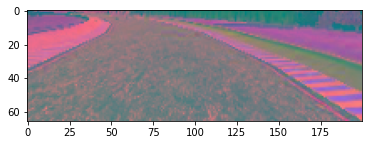

In [ ]:
plt.imshow(images[0])

In [ ]:
'''
temp = []
t_labels = []
for x in range(8000):
  temp.append(images[x])
  t_labels.append(labels[x])
del images
del labels
'''

In [ ]:
images = np.array(temp)
del temp

In [ ]:
labels = np.array(t_labels)
del t_labels

In [ ]:
#THIS IS VARIED IN DIFFERENT PARTS
#takes l
from matplotlib import pyplot as plt
import numpy as np
def gaussian(x, mu, sig):
    return np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))


def Preprocess_Labels_filter(l, mu, sig): 
  x_values =np.array([ i for i in range(-int(l/2),int(l/2)+1) ])
  x_values.reshape((l+1),-1)
  #mu = 0
  #sig = 5
  gaus = gaussian(x_values, mu, sig)
  plt.stem(x_values,gaus)
  plt.title("Guassian Filter")
  plt.xlabel("Coefficient Number")
  plt.ylabel("Coefficient Value")

  avg_labels_20= []
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,10000-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + gaus[j+int(l/2)]*labels[i+j]
    avg_labels_20.append(avg/l)

  for i in range(10000-int(l/2),10000):
    avg_labels_20.append(labels[i])
  avg_labels_20 = np.array(avg_labels_20)
  n=np.array(range(9999))
  plt.figure()
  plt.plot(n,avg_labels_20)
  return avg_labels_20

In [ ]:
'''
def Preprocess_Labels_filter(l,labels):               
  avg_labels_20= []
  val = len(labels)
  for i in range(int(l/2)):
    avg_labels_20.append(labels[i])
  for i in range(int(l/2)+1,val-int(l/2)):
    avg=0
    for j in range(-int(l/2),int(l/2)):
      avg = avg + labels[i+j]
    avg_labels_20.append(avg/l)
  for i in range(val-int(l/2),val):
    avg_labels_20.append(labels[i])
  return avg_labels_20
  '''

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  from ipykernel import kernelapp as app


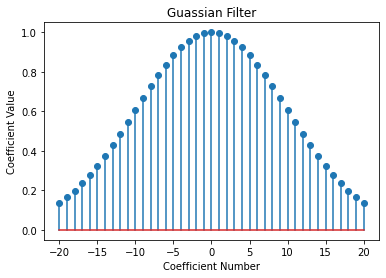

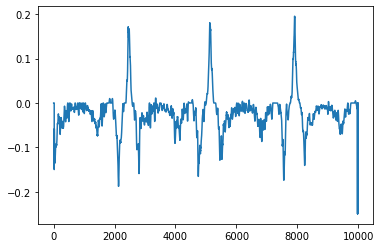

In [ ]:
avg_labels = Preprocess_Labels_filter(40,0,10)

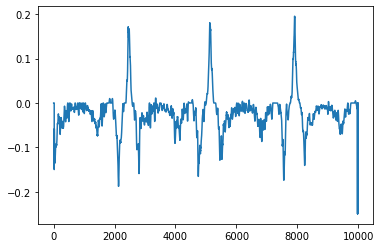

In [ ]:
plt.plot(avg_labels)

In [ ]:
x_train = []
x_test = []

for x in range(5000):
  x_train.append(images[x])

for x in range(1000): 
  x_test.append(images[x+7500])

In [ ]:
y_test = []
y_train = []

for x in range(5000):
  y_train.append(avg_labels[x])

for x in range(1000):
  y_test.append(avg_labels[x+7500])

In [ ]:
del images
del labels

In [ ]:
x_train = np.array(x_train)
x_test = np.array(x_test)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [ ]:
def nvidia_model():
    model = Sequential()
    #model.add(Lambda(lambda x: x/ 127.5 - 1.0))
    model.add(Conv2D(24,(5, 5),(2, 2),activation='relu'))
    model.add(Conv2D(36,(5, 5),(2, 2), activation='relu'))
    model.add(Conv2D(48,(5, 5),(2, 2),activation='relu'))
    model.add(BatchNormalization())
    model.add(Conv2D(64,(3, 3) ,activation='relu'))
    model.add(Conv2D(64,(3, 3),activation='relu'))
    model.add(Dropout(0.5))
    model.add(Flatten())
    model.add(Dense(600, activation='relu'))
    model.add(Dense(300, activation='relu'))
    model.add(Dense(150, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(1))
    model.compile('adam',loss="mse",metrics = ['acc'])
    return model

In [ ]:
def AlexNet_LSTM(img_shape = images[0].shape):
  model = Sequential()

  model.add(Conv2D(96, (11,11),strides=(4,4),activation='relu'))
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))



  model.add(Conv2D(256, (5,5),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))



  model.add(Conv2D(384, (3,3),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  

  model.add(Conv2D(384, (3,3),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  

  model.add(Conv2D(256, (3,3),strides=(1,1),activation='relu',padding='same')) 
  model.add(BatchNormalization())
  model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))

  model.add(Flatten())
  

  model.add(Dense(4096,activation='relu'))
  model.add(Dropout(0.7))

  model.add(Dense(4096,activation='relu'))
  model.add(Dropout(0.7))

  model.add(Dense(1))

  model.compile('adam',loss="mse",metrics = ['acc'])
  
  return model

In [ ]:
model3 = nvidia_model()

In [ ]:
history = model3.fit(x_train, y_train, batch_size=512, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50
10/10 [==============================] - 5s 247ms/step - loss: 0.0347 - acc: 0.0747 - val_loss: 0.0055 - val_acc: 0.0370
Epoch 2/50
10/10 [==============================] - 2s 190ms/step - loss: 0.0020 - acc: 0.0756 - val_loss: 0.0053 - val_acc: 0.0370
Epoch 3/50
10/10 [==============================] - 2s 191ms/step - loss: 0.0018 - acc: 0.0761 - val_loss: 0.0052 - val_acc: 0.0370
Epoch 4/50
10/10 [==============================] - 2s 187ms/step - loss: 0.0016 - acc: 0.0788 - val_loss: 0.0052 - val_acc: 0.0370
Epoch 5/50
10/10 [==============================] - 2s 184ms/step - loss: 0.0016 - acc: 0.0797 - val_loss: 0.0053 - val_acc: 0.0370
Epoch 6/50
10/10 [==============================] - 2s 189ms/step - loss: 0.0014 - acc: 0.0767 - val_loss: 0.0052 - val_acc: 0.0370
Epoch 7/50
10/10 [==============================] - 2s 185ms/step - loss: 0.0013 - acc: 0.0754 - val_loss: 0.0054 - val_acc: 0.0370
Epoch 8/50
10/10 [==============================] - 2s 185ms/step - loss: 0.

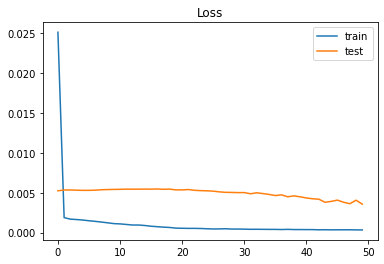

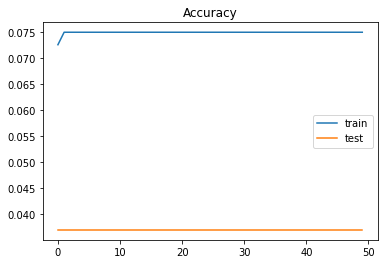

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

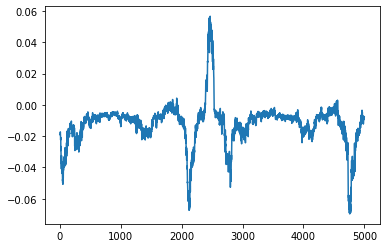

In [ ]:
x = model3.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Nvidia_model_proprocessed_gaussian_2.zip"' "/content/my_model.h5"

mkdir: cannot create directory ‘saved_model’: File exists
  adding: content/my_model.h5 (deflated 9%)


In [ ]:
model = AlexNet_LSTM()

In [ ]:
x_train.shape

(4000, 66, 200, 3)

In [ ]:
x_train = x_train.reshape(x_train.shape[0], 200, 66, 3)
x_test = x_test.reshape(x_test.shape[0], 200, 66, 3)

In [ ]:
history = model3.fit(x_train, y_train, batch_size=128, epochs=50, validation_data=(x_test, y_test))

Epoch 1/50


TypeError: ignored

In [ ]:
plt.figure()
plt.title("Loss")
plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["train","test"])
plt.show()

plt.figure()
plt.title("Accuracy")
plt.plot(history.history["acc"])
plt.plot(history.history["val_acc"])
plt.legend(["train","test"])
plt.show()

In [ ]:
x = model.predict(x_train)
plt.plot(x)

In [ ]:
!mkdir saved_model
model3.save('/content/my_model.h5')
!zip -r '/content/"Alex_Net_proprocessed.zip"' "/content/my_model.h5"